# **Assignment 03: Model Interpretability**
#### **Name: Shriya Pandita**
#### **NUID: 002747729**

**Background:**

In this notebook I am trying to analyse which feature helps better rank the world's top universities. I am exploring the QS World University Rankings® 2023 based on 8 key ranking indicators.
This year’s QS World University Rankings include almost 1,500 institutions from around the world.


# **Variable Description**

**Target Variables/Dependent Variables**

**Rank** - What is helping find the ranks of the university. This is the variable we have to predict.



**Predictor Variables/Independent Variables**

**ar score** - Academic Reputation score

**er score** - Employer Reputation score

**fsr score** - Faculty Student score

**cpf score**- Citations per faculty score

**ifr score** - International Faculty score

**isr score** - International Students score

**irn score** - International Research Network score

**ger score** - Employment Outcome score



# **Aim:**

**In this assignment we aim to interpret the results of**

Linear Model

Tree Based Model

Best model of AutoML H2O

**Using different Model Interpretibility Methods.**

In this excercise I have used

SHAP analysis

LIME analysis

Partial Dependence Plot Analysis

# **Libraries**

In [ ]:
#Importing all the necessary libraries required
!pip install eli5
!pip install shap
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install yellowbrick

import numpy as np
import pandas as pd
import seaborn as sns
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import matplotlib.pylab as plt
from matplotlib import pyplot
import pandas as pd
import statsmodels.api as sm
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestRegressor
import numpy as np 
import pandas as pd

from sklearn.preprocessing import LabelEncoder 
from sklearn.linear_model import LinearRegression

from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime

import warnings
warnings.filterwarnings('ignore')


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 KB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107747 sha256=dd63fbbfb0bf05ceb8e549b4572323ce5866da5315eceb0ca2afb3127413b099
  Stored in directory: /root/.cache/pip/wheels/7b/26/a5/8460416695a992a2966b41caa5338e5e7fcea98c9d032d055c
Successfully built eli5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.4/572.4 KB 3.5 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes:

In [ ]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html


In [ ]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [ ]:
# Seting the percentage of available memory that the process can use
pct_memory = 0.5

# Getting the total available virtual memory on the system
virtual_memory = psutil.virtual_memory()

# Calculating the minimum memory size required for the process in GB
min_mem_size = int(round(int(pct_memory*virtual_memory.available)/1073741824,0))

print(min_mem_size)

6


In [ ]:
# Starting the H2O server on a random port within the range of 5555 to 55555
for i in range(5555, 55556):
    try:
        h2o.init(strict_version_check=False, min_mem_size_GB=min_mem_size, port=i)
        print("H2O server started on port:", i)
        break
    except:
        continue
else:
    print("Could not start H2O server")

Checking whether there is an H2O instance running at http://localhost:5555..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpsb3xqgr8
  JVM stdout: /tmp/tmpsb3xqgr8/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpsb3xqgr8/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:5555
Connecting to H2O server at http://127.0.0.1:5555 ... successful.


H2O_cluster_uptime:,05 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.2
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_yucwmw
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,6 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


H2O server started on port: 5555


# **Data Exploration**

In [ ]:
# Reading csv file into Pandas Dataframe
df = pd.read_csv('https://raw.githubusercontent.com/shriyapandita06/shriyapandita06/main/2023%20QS%20World%20University%20Rankings%20(1).csv')
df.head(4)

,Rank,institution,location code,location,ar score,ar rank,er score,er rank,fsr score,fsr rank,...,cpf rank,ifr score,ifr rank,isr score,isr rank,irn score,irn rank,ger score,ger rank,score scaled
0,1,Massachusetts Institute of Technology (MIT),US,United States,100.0,5,100.0,4,100.0,14,...,5,100.0,54,90.0,109,96.1,58,100.0,3,100
1,2,University of Cambridge,UK,United Kingdom,100.0,2,100.0,2,100.0,11,...,55,100.0,60,96.3,70,99.5,6,100.0,9,98.8
2,3,Stanford University,US,United States,100.0,4,100.0,5,100.0,6,...,9,99.8,74,60.3,235,96.3,55,100.0,2,98.5
3,4,University of Oxford,UK,United Kingdom,100.0,3,100.0,3,100.0,8,...,64,98.8,101,98.4,54,99.9,3,100.0,7,98.4


In [ ]:
# Getting the dimensions of the dataframe
df.shape

(1422, 21)

In [ ]:
# Summary of the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1422 entries, 0 to 1421
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Rank           1422 non-null   int64  
 1   institution    1422 non-null   object 
 2   location code  1422 non-null   object 
 3   location       1422 non-null   object 
 4   ar score       1422 non-null   float64
 5   ar rank        1422 non-null   object 
 6   er score       1421 non-null   float64
 7   er rank        1422 non-null   object 
 8   fsr score      1420 non-null   float64
 9   fsr rank       1422 non-null   object 
 10  cpf score      1417 non-null   float64
 11  cpf rank       1422 non-null   object 
 12  ifr score      1324 non-null   float64
 13  ifr rank       1324 non-null   object 
 14  isr score      1365 non-null   float64
 15  isr rank       1365 non-null   object 
 16  irn score      1409 non-null   float64
 17  irn rank       1409 non-null   object 
 18  ger scor

In [ ]:
# Checking for count of null values 
df.isnull().sum()

Rank              0
institution       0
location code     0
location          0
ar score          0
ar rank           0
er score          1
er rank           0
fsr score         2
fsr rank          0
cpf score         5
cpf rank          0
ifr score        98
ifr rank         98
isr score        57
isr rank         57
irn score        13
irn rank         13
ger score        12
ger rank         12
score scaled      0
dtype: int64

# **Pre-procesing**

In [ ]:
# Dropping data fields not required for analysis 
df2 = df.copy()
df2.drop(columns = ['institution','location','location code','ar rank','er rank','fsr rank','cpf rank','ifr rank','isr rank','irn rank','ger rank','score scaled'], inplace = True)
df2.head()

,Rank,ar score,er score,fsr score,cpf score,ifr score,isr score,irn score,ger score
0,1,100.0,100.0,100.0,100.0,100.0,90.0,96.1,100.0
1,2,100.0,100.0,100.0,92.3,100.0,96.3,99.5,100.0
2,3,100.0,100.0,100.0,99.9,99.8,60.3,96.3,100.0
3,4,100.0,100.0,100.0,90.0,98.8,98.4,99.9,100.0
4,5,100.0,100.0,99.4,100.0,76.9,66.9,100.0,100.0


In [ ]:
# Checking for count of null values 
df2.isnull().sum()

Rank          0
ar score      0
er score      1
fsr score     2
cpf score     5
ifr score    98
isr score    57
irn score    13
ger score    12
dtype: int64

### Imputing Missing Values - KNN Imputation

In [ ]:
# Creating a copy of the dataframe
newdata= df2.copy()
newdata.head()

,Rank,ar score,er score,fsr score,cpf score,ifr score,isr score,irn score,ger score
0,1,100.0,100.0,100.0,100.0,100.0,90.0,96.1,100.0
1,2,100.0,100.0,100.0,92.3,100.0,96.3,99.5,100.0
2,3,100.0,100.0,100.0,99.9,99.8,60.3,96.3,100.0
3,4,100.0,100.0,100.0,90.0,98.8,98.4,99.9,100.0
4,5,100.0,100.0,99.4,100.0,76.9,66.9,100.0,100.0


In [ ]:
# performing knn imputation to fill in the missing values
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler
imputer = KNNImputer(n_neighbors=5)
df2 = pd.DataFrame(imputer.fit_transform(df2), columns = df2.columns)

df2.isnull().sum()

Rank         0
ar score     0
er score     0
fsr score    0
cpf score    0
ifr score    0
isr score    0
irn score    0
ger score    0
dtype: int64

In [ ]:
# Viewing top 5 rows of the dataframe
df2.head()

,Rank,ar score,er score,fsr score,cpf score,ifr score,isr score,irn score,ger score
0,1.0,100.0,100.0,100.0,100.0,100.0,90.0,96.1,100.0
1,2.0,100.0,100.0,100.0,92.3,100.0,96.3,99.5,100.0
2,3.0,100.0,100.0,100.0,99.9,99.8,60.3,96.3,100.0
3,4.0,100.0,100.0,100.0,90.0,98.8,98.4,99.9,100.0
4,5.0,100.0,100.0,99.4,100.0,76.9,66.9,100.0,100.0


In [ ]:
# Viewing information about the dataframe features
df2.describe()

,Rank,ar score,er score,fsr score,cpf score,ifr score,isr score,irn score,ger score
count,1422.000000,1422.000000,1422.000000,1422.000000,1422.000000,1422.000000,1422.000000,1422.000000,1422.000000
mean,711.500000,20.124684,20.650914,29.964937,24.460028,30.331561,25.808776,49.399409,26.100647
std,410.640354,22.802706,24.020620,28.165843,27.886674,33.455492,30.542261,30.144495,26.117151
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,356.250000,5.400000,4.400000,8.200000,3.100000,4.800000,3.200000,21.625000,6.800000
50%,711.500000,10.800000,10.300000,18.200000,10.950000,12.640000,10.300000,47.000000,15.500000
75%,1066.750000,23.775000,26.950000,43.475000,39.200000,49.075000,38.700000,77.375000,36.300000
max,1422.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000


**Summary Statistics**

This table shows summary statistics for a dataset with 1422 observations and 9 variables.

The variables are: 'Rank', 'ar score', 'er score', 'fsr score', 'cpf score', 'ifr score', 'isr score', 'irn score' and 'ger score'.

The "count" row shows the number of observations for each variable, while the "mean" row shows the average value of each variable.

The "std" row shows the standard deviation of each variable, which is a measure of how much the values vary from the mean.

The "min" and "max" rows show the smallest and largest values observed for each variable.

The "25%", "50%", and "75%" rows show the values at the 25th, 50th, and 75th percentiles of the distribution, respectively.

These percentiles divide the observations into quarters, with the 25th percentile being the value below which 25% of the observations fall, and so on.

# **Heat Map**

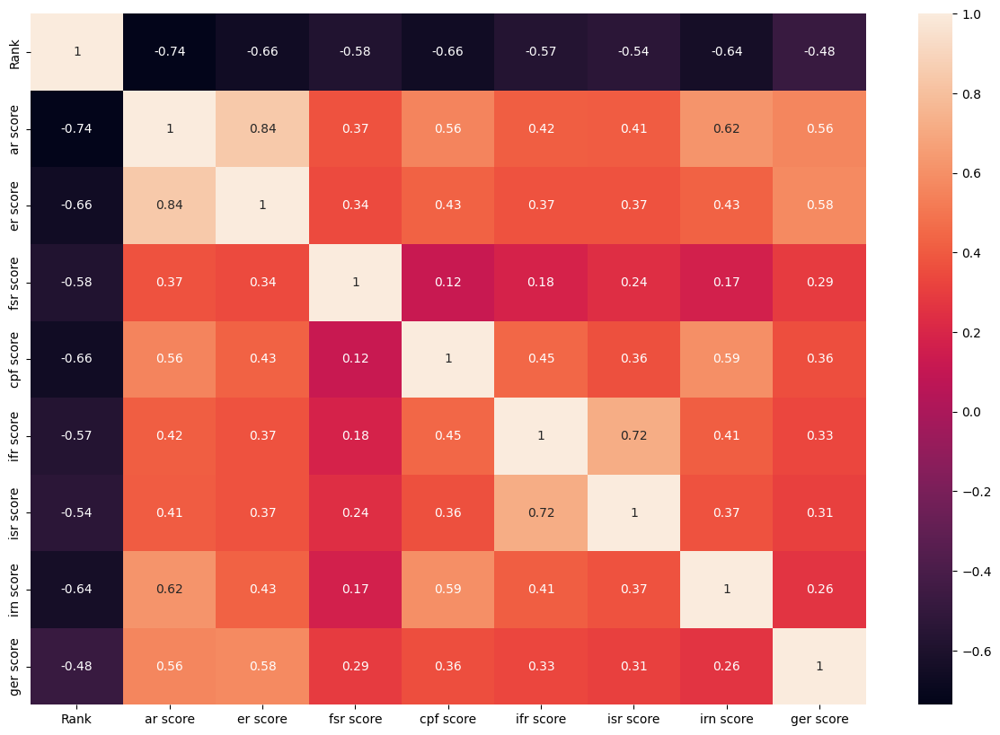

In [ ]:
# Plotting the Heat Map
plt.figure(figsize=(15,10))
sns.heatmap(df2.corr(), annot=True);

#### **Correlation Analysis**

Above is a graphical representation of the correlation between different features in the dataset. The heatmap displays a matrix of colors that represent the strength of the correlation between pairs of variables.

We can calculate the correlation between pairs of variables using a correlation coefficient, such as the Pearson correlation coefficient. This coefficient measures the linear relationship between two variables, with values ranging from -1 (perfect negative correlation) to 1 (perfect positive correlation). A value of 0 indicates no correlation.

The above heatmap displays the correlation coefficients as colors in a matrix, with each variable plotted both on the x and y axis. The color of each cell in the matrix indicates the strength of the correlation between the corresponding pair of variables, with a color scale ranging from low (e.g. light orange) to high (e.g. dark purple).

A correlation heatmap can help you identify the relationships between pairs of variables in a dataset. You can use it to spot patterns and trends, and to identify variables that are strongly correlated (either positively or negatively). This information can be useful for exploratory data analysis and for identifying potential predictors in statistical models.


***From the above matrix we can conclude a few things:***

* ar score and er score are highly correlated.
* ifr score and isr score are highly correlated.

# **Model**

In [ ]:
# Splitting data into train and test sets
train, test = train_test_split(df2, test_size=0.2, random_state=17)

print(f"No. of training examples: {train.shape[0]}")
print(f"No. of testing examples: {test.shape[0]}")

No. of training examples: 1137
No. of testing examples: 285


In [ ]:
# Separating predictors and target variables for train and test sets
x_train=train.drop('Rank',axis=1)
y_train=train[['Rank']]

x_test=test.drop('Rank',axis=1)
y_test=test[['Rank']]

# Checking the shapes of the resulting dataframes
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((1137, 8), (1137, 1), (285, 8), (285, 1))

In [ ]:
x_train.head(2)

,ar score,er score,fsr score,cpf score,ifr score,isr score,irn score,ger score
241,36.1,50.5,21.2,41.9,80.6,54.2,85.2,35.3
226,7.8,1.7,97.7,80.9,38.2,1.7,56.9,4.2


In [ ]:
y_train.head(2)

,Rank
241,242.0
226,227.0


# **Linear Regression**

In [ ]:
# Fitting a linear regression model on the training data
lr = LinearRegression()
lr.fit(x_train, y_train)

LinearRegression()

In [ ]:
# Scoring the model on the test data
lr_score = lr.score(x_test, y_test)
print(f"Linear Regression score: {lr_score}")

Linear Regression score: 0.832144866167164


In [ ]:
# Predicting target variable for test data
y_pred = lr.predict(x_test)
print(f"Predicted values: {y_pred.flatten()[:5]}")
print(f"Actual values: {y_test.values.flatten()[:5]}")

Predicted values: [ 648.00068122  139.55102539  799.95364833  725.17968641 1131.82359413]
Actual values: [524. 199. 823. 428. 915.]


In [ ]:
# Evaluating the performance of the model
lr_mse = mean_squared_error(y_test.values, y_pred)
lr_rmse = mean_squared_error(y_test.values, y_pred,squared=False) #RMSE
lr_mae = mean_absolute_error(y_test.values, y_pred)
lr_r = r2_score(y_test.values, y_pred)

print('Score Mean Squared Error      = {}'.format(lr_mse))
print('Score Root Mean Squared Error = {}'.format(lr_rmse))
print('Score Mean Absolute Error     = {}'.format(lr_mae))
print('Score R2                      = {}'.format(lr_r))

Score Mean Squared Error      = 29967.236882059016
Score Root Mean Squared Error = 173.11047594544652
Score Mean Absolute Error     = 143.34263198040935
Score R2                      = 0.832144866167164


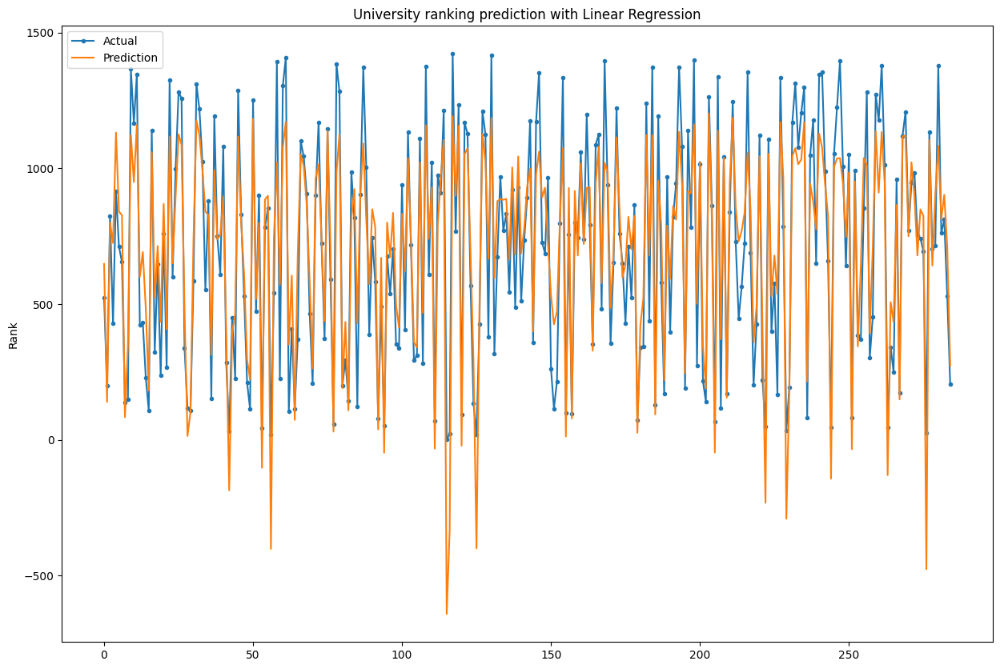

In [ ]:
# Plotting actual vs predicted values
plt.figure(figsize=(15,10))
plt.plot(range(len(y_test)), y_test, marker='.', label="Actual")
plt.plot(range(len(y_test)), y_pred.flatten(), label="Prediction")
plt.ylabel('Rank')
plt.title('University ranking prediction with Linear Regression')
plt.legend()
plt.show()


In [ ]:
# Creating a dataframe with actual and predicted values
prediction = pd.DataFrame()
prediction['Actual'] = y_test.values.flatten()
prediction['Linear Regression'] = y_pred.flatten()
prediction['Linear Regression'] = prediction['Linear Regression'].round(0)
prediction.head()

,Actual,Linear Regression
0,524.0,648.0
1,199.0,140.0
2,823.0,800.0
3,428.0,725.0
4,915.0,1132.0


In [ ]:
# Adding a constant to the x_train matrix for the intercept term
X_train = sm.add_constant(x_train)


In [ ]:
# OLS Regression model on the training data
model = sm.OLS(y_train, X_train)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                   Rank   R-squared:                       0.831
Model:                            OLS   Adj. R-squared:                  0.830
Method:                 Least Squares   F-statistic:                     691.9
Date:                Wed, 29 Mar 2023   Prob (F-statistic):               0.00
Time:                        20:39:29   Log-Likelihood:                -7436.8
No. Observations:                1137   AIC:                         1.489e+04
Df Residuals:                    1128   BIC:                         1.494e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1283.8202     11.424    112.374      0.0

We will consider a significance value of 0.05 for determining the significance of our predictor variables which means if

p value is greater that 0.05 - feature is not significant for predicting the target variable
p value is less than 0.05 - feature is significant for predicting the target variable

1. The ar score has the p-value 0.141, which is more and hence it is not a significant feature.
2. The er score has the p-value 0.000, which is lesser and hence it is a significant feature.
3. The fsr score has the p-value 0.0, which is lesser and hence it is a significant feature.
4. The cpf score has the p-value 0.0, which is lesser and hence it is a significant feature.
5. The ifr score has the p-value 0.0, which is lesser and hence it is a significant feature.
6. The isr score has the p-value 0.0, which is greater and hence it is a significant feature.
7. The irn score has the p-value 0.0, which is lesser and hence it is a significant feature.
8. The ger score has the p-value 0.872, which is more and hence it is not a significant feature.



Skew and Kurtosis

Skewness tells us the amount and direction of skew(Departure from the central axis) and Kurtosis tells us how tall and sharp the central peak is. The optimum value for these two measures is 0, in our case we have a value for Skew and Kurtosis as 0.438, 3.430 respectively.

Durbin-Watson

The Durbin-Watson test is a statistical test to detect auto-correlation in the residuals of a regression analysis. Its range is 0 to 4.

Value of 2 indicates that no auto correlation is detected
Value between 0 to 2 indicates that there is positive auto correlation detected
Value between 2 to 4 indicates that there is negatibe auto correlation detected
Our model has a DW score of 1.989 which could be interpreted as a positive auto-correlation in the residuals of regression.

Jarque-Bera Test

The JB test is known as the test of Normality, irrespective if the data has skew or kurtosis. If it is far from zero, it signals the data do not have a normal distribution. Our JB value is 45.123 which again re-inforces the interpretation we got from Skew and Kurtosis.

# ** Interpreting Regression Co-efficients**

In [ ]:
# Predicting target variable for test data
y_pred = lr.predict(x_test)

In [ ]:
# Calculating residuals
residuals = y_test.values.flatten() - y_pred.flatten()

<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

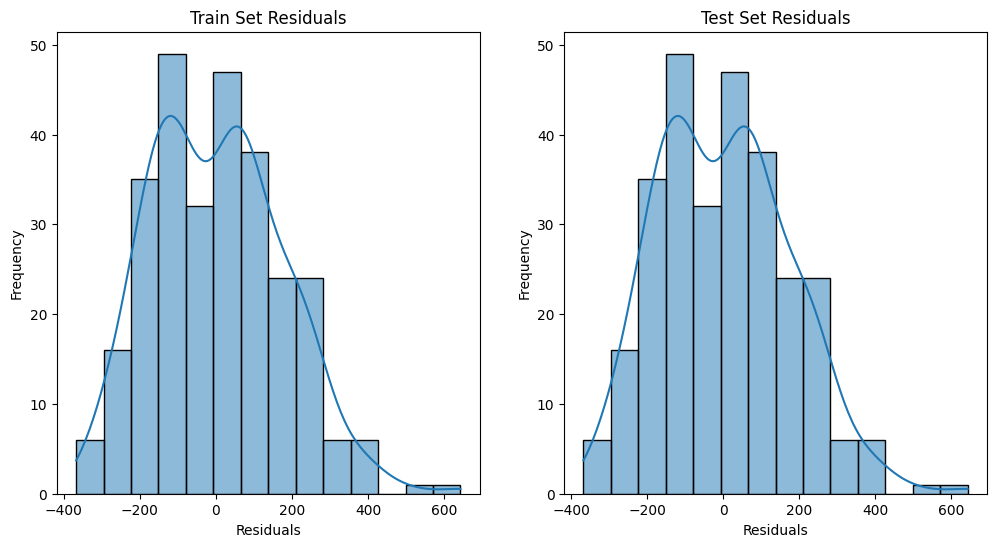

In [ ]:
# Plot residuals to check for normality
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
sns.histplot(residuals, ax=axs[0], kde=True)
sns.histplot(residuals, ax=axs[1], kde=True)
axs[0].set_xlabel('Residuals')
axs[0].set_ylabel('Frequency')
axs[0].set_title('Train Set Residuals')
axs[1].set_xlabel('Residuals')
axs[1].set_ylabel('Frequency')
axs[1].set_title('Test Set Residuals')
plt.tight_layout

As the shape of the graph is bell shaped and the data is normally distributed, the model is fitting well to the data.

# **Tree-based Model**

### **Decision Tree**

In [ ]:
dt = DecisionTreeRegressor()
dt.fit(x_train, y_train)

DecisionTreeRegressor()

In [ ]:
#Finding the R-squared score of the model on the test data
dt_score = dt.score(x_test, y_test)
dt_score

0.9044571349678335

In [ ]:
y_pred = dt.predict(x_test)
print(y_pred.flatten()[:5])
print(y_test.values.flatten()[:5])

[ 407.  299. 1002.  327.  917.]
[524. 199. 823. 428. 915.]


The line y_pred = dt.predict(x_test) generates predicted values of the target variable for the test dataset x_test. These predictions are then printed using print(y_pred.flatten()[:5]).

The flatten method is used to convert the predicted values from a 2D array to a 1D array to compare with actual values.

In [ ]:
dt_mse = mean_squared_error(y_test.values, y_pred)
dt_rmse = mean_squared_error(y_test.values, y_pred,squared=False) #RMSE
dt_mae = mean_absolute_error(y_test.values, y_pred)
dt_r = r2_score(y_test.values, y_pred)

print('Score Mean Squared Error      = {}'.format(dt_mse))
print('Score Root Mean Squared Error = {}'.format(dt_rmse))
print('Score Mean Absolute Error     = {}'.format(dt_mae))
print('Score R2                      = {}'.format(dt_r))

Score Mean Squared Error      = 17057.301754385964
Score Root Mean Squared Error = 130.60360544175634
Score Mean Absolute Error     = 90.19298245614036
Score R2                      = 0.9044571349678335


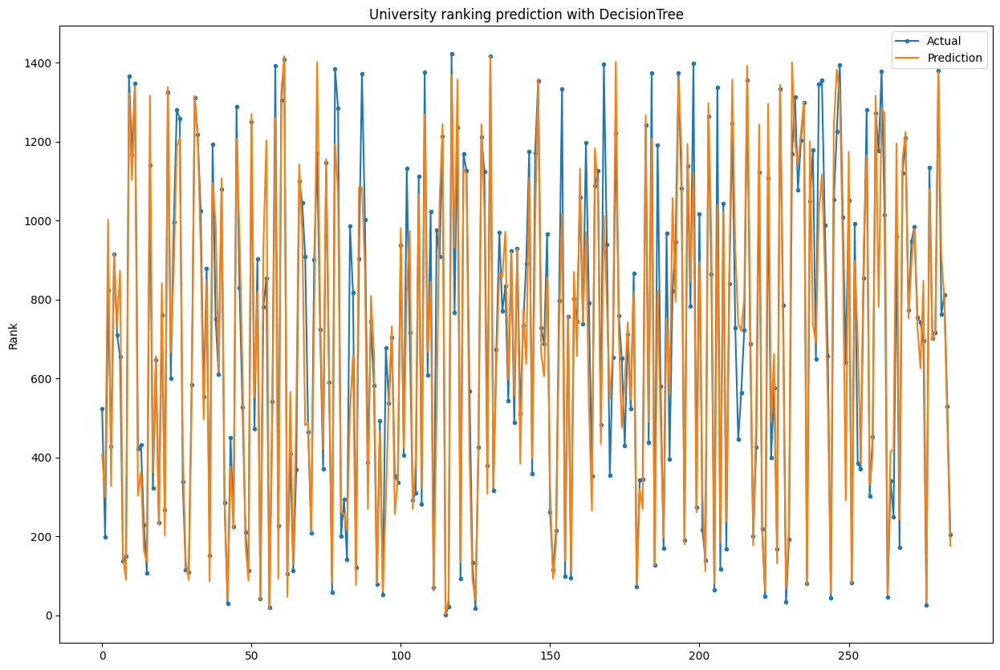

In [ ]:
# Plotting actual vs predicted values
plt.figure(figsize=(15,10))
plt.plot(range(len(y_test)), y_test, marker='.', label="Actual")
plt.plot(range(len(y_test)), y_pred.flatten(), label="Prediction")
plt.ylabel('Rank')
plt.title('University ranking prediction with DecisionTree')
plt.legend()
plt.show()

In [ ]:
prediction['DecisionTree'] = y_pred.flatten()
prediction['DecisionTree'] = prediction['DecisionTree'].round(0)
prediction.head(4) 

,Actual,Linear Regression,DecisionTree
0,524.0,648.0,407.0
1,199.0,140.0,299.0
2,823.0,800.0,1002.0
3,428.0,725.0,327.0


### **Random Forest**

In [ ]:
rf = RandomForestRegressor(max_depth=10, random_state=0)

rf.fit(x_train,y_train)

RandomForestRegressor(max_depth=10, random_state=0)

In [ ]:
# importing 
from sklearn.tree import export_graphviz
import pydot
import matplotlib.image as mpimg
from IPython.display import Image

In [ ]:
#Finding the R-squared score of the model on the test data
rf_score = rf.score(x_test, y_test)
rf_score

0.9624681033840977

In [ ]:
#generating predictive values and flatten them
y_pred = rf.predict(x_test)
print(y_pred.flatten()[:5])
print(y_test.values.flatten()[:5])

[502.60721861 254.91437199 763.23949019 484.94432791 953.73469458]
[524. 199. 823. 428. 915.]


In [ ]:
#evaluating scores
rf_mse = mean_squared_error(y_test.values, y_pred)
rf_rmse = mean_squared_error(y_test.values, y_pred,squared=False) #RMSE
rf_mae = mean_absolute_error(y_test.values, y_pred)
rf_r = r2_score(y_test.values, y_pred)

print('Score Mean Squared Error      = {}'.format(rf_mse))
print('Score Root Mean Squared Error = {}'.format(rf_rmse))
print('Score Mean Absolute Error     = {}'.format(rf_mae))
print('Score R2                      = {}'.format(rf_r))

Score Mean Squared Error      = 6700.582882628954
Score Root Mean Squared Error = 81.85708816363403
Score Mean Absolute Error     = 59.42184517370106
Score R2                      = 0.9624681033840977


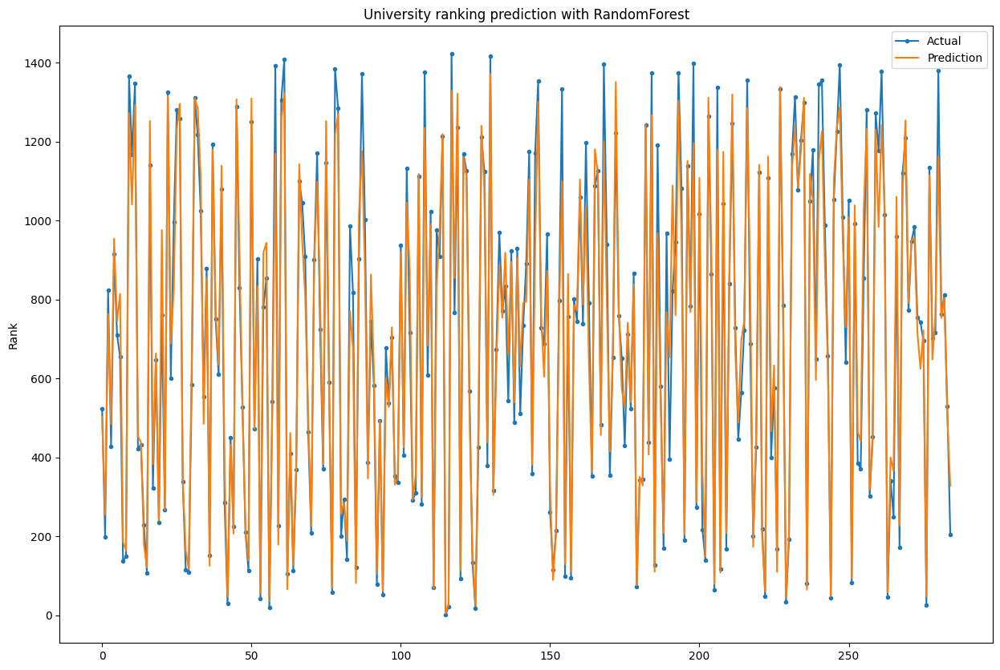

In [ ]:
# Plotting actual vs predicted values
plt.figure(figsize=(15,10))
plt.plot(range(len(y_test)), y_test, marker='.', label="Actual")
plt.plot(range(len(y_test)), y_pred.flatten(), label="Prediction")
plt.ylabel('Rank')
plt.title('University ranking prediction with RandomForest')
plt.legend()
plt.show()

The model is performing better as the predicted values are much closer to the actual values.

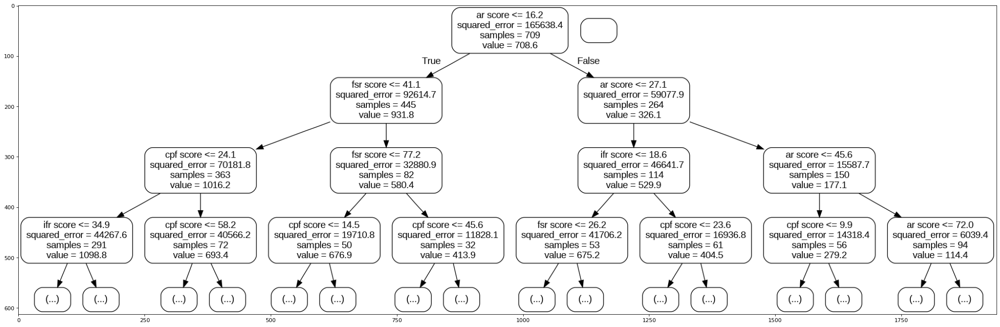

In [121]:
# Creating a decision tree visualization
from matplotlib.pyplot import figure
figure(figsize=(32, 24), dpi=80)
tree = rf.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(x_train.columns),
    rounded=True,
    precision=1,
    max_depth=3 # added parameter
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

Random Forest Regressor works on the concept of the wisdom of the crowd. The above decision tree is one of the many trees involved in predicting the target variable. Each decision tree regression predicts a number as an output for a given input. Random forest regression takes the average of those predictions as its final output.

As usual, the tree has conditions on each internal node and a value associated with each leaf (i.e. the value to be predicted). But additionally, we’ve plotted out the value at each internal node i.e. the mean of the response variables in that region.

Let us try to understand how the above decision tree is working by interpreting the nodes starting from the extreme left side as leaf 1.

The decision tree visualization showed that the most important feature in predicting the ranking was the "fsr score", followed by "cpf score" and "er score", while the least important feature was "ger score".

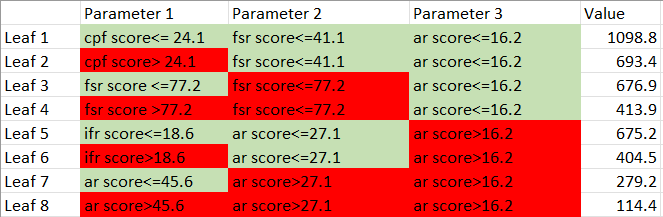

Please refer to the above figure to understand the nodes The first leaf gets gains from all parameters as the condition satisfied for all 3 parameters The second leaf gets gains from parameters 2, and 3 but not from parameters 1 And Similarly, the red marked cells are the losses incurred and Green marked cells are the gains incurred from the parameters which give us output as values for this specific decision tree

In [ ]:
prediction['RandomForest'] = y_pred.flatten()
prediction['RandomForest'] = prediction['RandomForest'].round(0)
prediction.head(4)

,Actual,Linear Regression,DecisionTree,RandomForest
0,524.0,648.0,407.0,503.0
1,199.0,140.0,299.0,255.0
2,823.0,800.0,1002.0,763.0
3,428.0,725.0,327.0,485.0


**As we can see, on comparing the predicted values for all 3 methods. Random Forest has given the values nearest to the actual values.**

Text(0, 0.5, 'Importance')

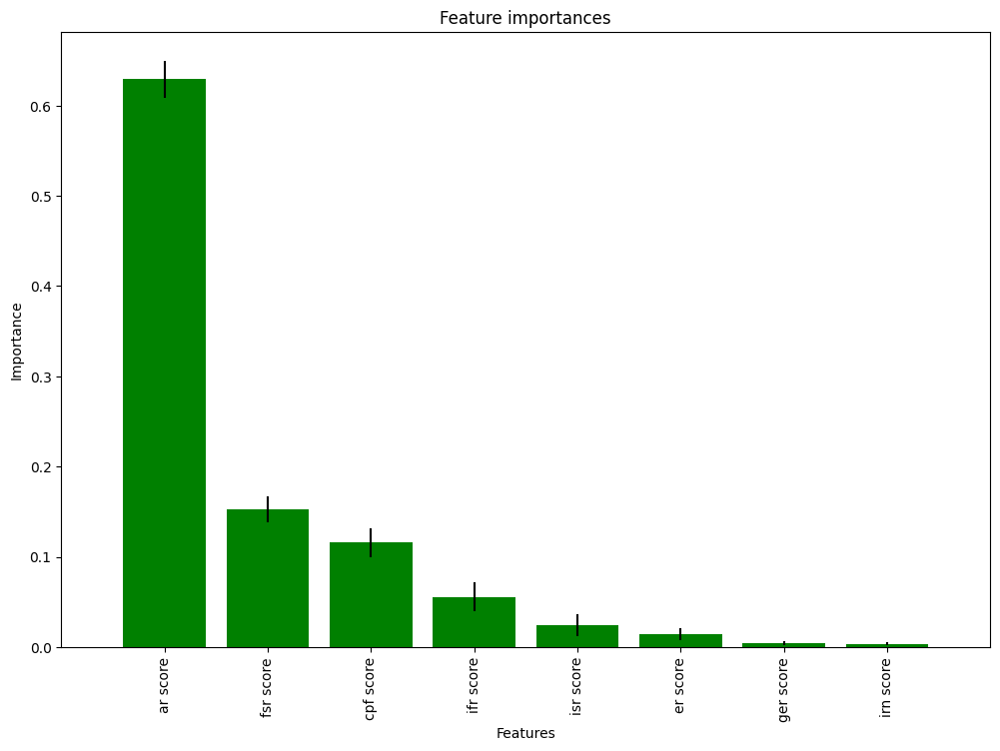

In [ ]:
# Plotting the feature importance for random forest
importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Plotting the feature importances
plt.figure(figsize=(12,8))
plt.title("Feature importances")
plt.bar(range(x_train.shape[1]), importances[indices],
       color="g", yerr=std[indices], align="center")
plt.xticks(range(x_train.shape[1]), x_train.columns[indices], rotation='vertical')
plt.xlim([-1, x_train.shape[1]])
plt.xlabel('Features')
plt.ylabel('Importance')


**From this model we can see that the ar score has the most importance, followed by fsr score.**


# **Comparison of the models**

In [ ]:
# Comparing all the values for all 3 methods
print('Score MSE LinearRegression  = {}'.format(lr_mse))
print('Score MSE DecisionTree      = {}'.format(dt_mse))
print('Score MSE RandomForest      = {}'.format(rf_mse))

print('='*55)
print('Score RMSE LinearRegression = {}'.format(lr_rmse))
print('Score RMSE DecisionTree     = {}'.format(dt_rmse))
print('Score RMSE RandomForest     = {}'.format(rf_rmse))

print('='*55)
print('Score MAE LinearRegression  = {}'.format(lr_mae))
print('Score MAE DecisionTree      = {}'.format(dt_mae))
print('Score MAE RandomForest      = {}'.format(rf_mae))

print('='*55)
print('Score R2 Linear Regression  = {}'.format(lr_r))
print('Score R2 DecisionTree       = {}'.format(dt_r))
print('Score R2 RandomForest       = {}'.format(rf_r))


Score MSE LinearRegression  = 29967.236882059016
Score MSE DecisionTree      = 17057.301754385964
Score MSE RandomForest      = 6700.582882628954
Score RMSE LinearRegression = 173.11047594544652
Score RMSE DecisionTree     = 130.60360544175634
Score RMSE RandomForest     = 81.85708816363403
Score MAE LinearRegression  = 143.34263198040935
Score MAE DecisionTree      = 90.19298245614036
Score MAE RandomForest      = 59.42184517370106
Score R2 Linear Regression  = 0.832144866167164
Score R2 DecisionTree       = 0.9044571349678335
Score R2 RandomForest       = 0.9624681033840977


**As seen from the outputs above Random Forest yeilds the best results :
Lower the MSE Score, better is the performance. Random Forest has the lowest score of 6700.582882628954.**

**Lower the RMSE Score, better is the performance. Random Forest has the lowest score of 81.85708816363403.**

**Lower the MAE Score, better is the performance. Random Forest has the lowest score of 59.42184517370106.**

**Higher the R2 score, better is the performance. Random Forest has the highest score if 0.9624681033840977.**

# **Using AutoML to find the best model**


### H2O

In [ ]:
# Initializing H2O cluster
h2o.init()

# Converting pandas dataframe to H2O dataframe
h2o_df = h2o.H2OFrame(df2)  

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpluhd5ywh
  JVM stdout: /tmp/tmpluhd5ywh/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpluhd5ywh/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,07 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.2
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_e9kex8
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
# Checking for datatypes
df2.dtypes

Rank         float64
ar score     float64
er score     float64
fsr score    float64
cpf score    float64
ifr score    float64
isr score    float64
irn score    float64
ger score    float64
dtype: object

In [ ]:
# Setting up the data split between training and test dataset.
pct_rows = 0.80  

# Splitting the data into training and testing sets
df_train, df_test = h2o_df.split_frame([pct_rows])  

In [ ]:
# Printing the shape of the training and test data
print("Training data shape: ", df_train.shape)
print("Test data shape: ", df_test.shape)

Training data shape:  (1136, 9)
Test data shape:  (286, 9)


In [ ]:
df_train.head()

Rank,ar score,er score,fsr score,cpf score,ifr score,isr score,irn score,ger score
1,100,100,100,100,100,90,96.1,100
2,100,100,100,92.3,100,96.3,99.5,100
3,100,100,100,99.9,99.8,60.3,96.3,100
4,100,100,100,90,98.8,98.4,99.9,100
5,100,100,99.4,100,76.9,66.9,100,100
8,99.4,98.6,97.6,77,99.2,100,100,90.3
9,98.6,91.3,74.2,99.2,100,98,96.2,91.1
10,99.2,92.2,92.9,86.8,81.6,76,89.6,98.2
11,99.5,94.1,79.8,91.8,100,73.5,89.9,99.6
12,99.3,96.5,87.3,96.7,57.1,36.9,77.5,91.4


In [ ]:
# Conversion to list
X = df2.columns.tolist()

In [ ]:
print(X)

['Rank', 'ar score', 'er score', 'fsr score', 'cpf score', 'ifr score', 'isr score', 'irn score', 'ger score']


In [ ]:
y = 'Rank'

In [ ]:
X.remove(y)

In [ ]:
print(y)

Rank


In [ ]:
# Setting of AutoML
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)  

In [ ]:
# Training the dataset on different models
aml.train(x=X, y=y, training_frame=df_train)  

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),16/59
# GBM base models (used / total),6/22
# XGBoost base models (used / total),8/30
# DRF base models (used / total),0/2
# DeepLearning base models (used / total),2/4
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


In [ ]:
# Leaderboard of AutoML output
print(aml.leaderboard)

model_id                                                    rmse      mse      mae       rmsle    mean_residual_deviance
StackedEnsemble_AllModels_3_AutoML_1_20230329_203952     58.2217  3389.76  41.6975  nan                          3389.76
StackedEnsemble_BestOfFamily_4_AutoML_1_20230329_203952  58.9388  3473.78  42.9406  nan                          3473.78
StackedEnsemble_AllModels_2_AutoML_1_20230329_203952     59.3255  3519.51  43.4876  nan                          3519.51
StackedEnsemble_BestOfFamily_3_AutoML_1_20230329_203952  60.4033  3648.55  44.3246  nan                          3648.55
StackedEnsemble_AllModels_1_AutoML_1_20230329_203952     61.189   3744.1   44.6744  nan                          3744.1
StackedEnsemble_BestOfFamily_2_AutoML_1_20230329_203952  63.4334  4023.8   46.4901  nan                          4023.8
GBM_2_AutoML_1_20230329_203952                           65.1059  4238.78  47.4764    0.116423                   4238.78
GBM_4_AutoML_1_20230329_203952    

In [ ]:
# Getting id of the models
model_index = 0
glm_index = 0
glm_model = ""
aml_leaderboard_df = aml.leaderboard.as_data_frame()
models_dict = {}
for m in aml_leaderboard_df["model_id"]:
    models_dict[m] = model_index
    if "StackedEnsemble" not in m:
        break
    model_index = model_index + 1

for m in aml_leaderboard_df["model_id"]:
    if "GLM" in m:
        models_dict[m] = glm_index
        break
    glm_index = glm_index + 1
models_dict

{'StackedEnsemble_AllModels_3_AutoML_1_20230329_203952': 0,
 'StackedEnsemble_BestOfFamily_4_AutoML_1_20230329_203952': 1,
 'StackedEnsemble_AllModels_2_AutoML_1_20230329_203952': 2,
 'StackedEnsemble_BestOfFamily_3_AutoML_1_20230329_203952': 3,
 'StackedEnsemble_AllModels_1_AutoML_1_20230329_203952': 4,
 'StackedEnsemble_BestOfFamily_2_AutoML_1_20230329_203952': 5,
 'GBM_2_AutoML_1_20230329_203952': 6,
 'GLM_1_AutoML_1_20230329_203952': 61}

In [ ]:
print(model_index)
best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])

6


In [ ]:
best_model.algo

'gbm'

**The best performing model among all the trained models is a Gradient Boosting Machine (GBM) algorithm.**

In [ ]:
# Use the best model to make predictions on the test data
predictions = best_model.predict(df_test)


gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [ ]:
# Convert predictions and actual values to pandas dataframes
pred_df = predictions.as_data_frame()
actual_df = df_test[y].as_data_frame()


In [ ]:
# Getting the predicted and actual values as numpy arrays
y_pred = predictions.as_data_frame().values[:, 0]
y_actual = df_test[y].as_data_frame().values[:, 0]

# Calculating the MAE, MSE, R2, and RMSE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

mae = mean_absolute_error(y_actual, y_pred)
mse = mean_squared_error(y_actual, y_pred)
r2 = r2_score(y_actual, y_pred)
rmse = np.sqrt(mse)

print("MAE: ", mae)
print("MSE: ", mse)
print("R2: ", r2)
print("RMSE: ", rmse)


MAE:  46.21544252991616
MSE:  4168.434317898383
R2:  0.9748735644458382
RMSE:  64.5634131524843


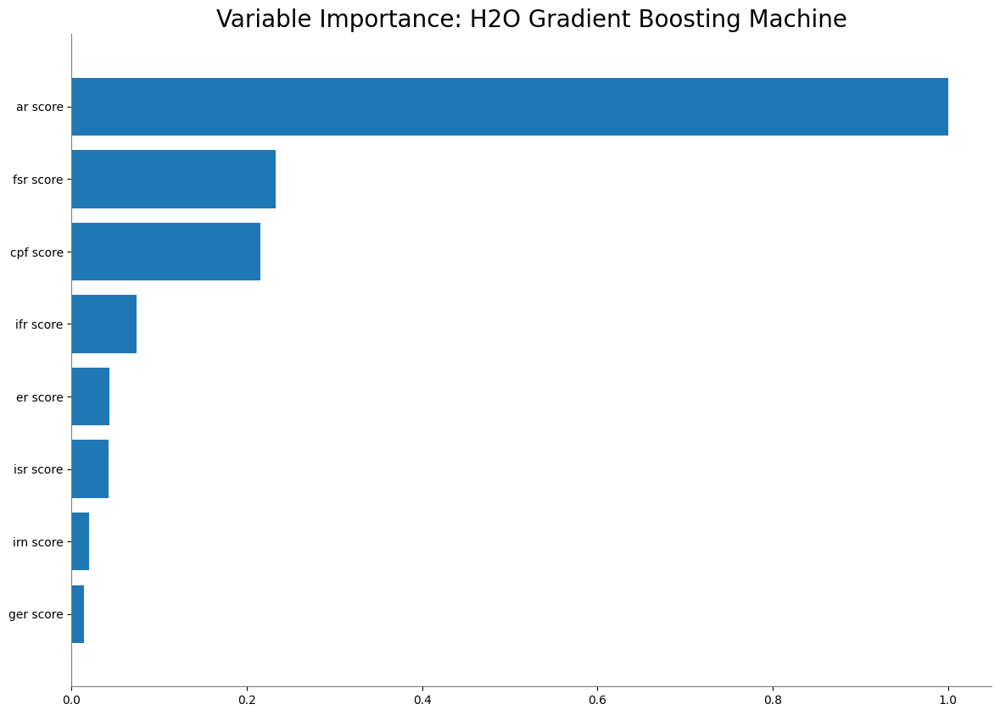

<Figure size 640x480 with 0 Axes>

In [ ]:
if best_model.algo in [
    "gbm",
    "drf",
    "xrt",
    "xgboost",
]:  # Importance of all the variables in GBM algorithm.
    best_model.varimp_plot()


**Inference for the above plot:**

The graph on top represents the Distributed Random Forest Model for H20's variable Importance.

* We can infer that, out of all the variables, ar score is the most significant, with a significance of 1.0 (as if this significance were scaled to 100%). Also, fsr score is the next one holding significance.

# **SHAP Analysis**

### AutoML

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_3_AutoML_1_20230329_203952,61.0591,3728.21,43.575,nan,3728.21,526,0.589218,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_1_20230329_203952,61.7086,3807.95,45.3207,nan,3807.95,528,0.257372,StackedEnsemble
StackedEnsemble_BestOfFamily_4_AutoML_1_20230329_203952,61.8367,3823.78,45.5666,nan,3823.78,182,0.070464,StackedEnsemble
StackedEnsemble_BestOfFamily_3_AutoML_1_20230329_203952,62.9986,3968.82,46.7889,nan,3968.82,419,0.09863,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_1_20230329_203952,63.259,4001.7,45.6192,nan,4001.7,558,0.258261,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_1_20230329_203952,64.4964,4159.79,46.9925,nan,4159.79,403,0.072759,StackedEnsemble
GBM_2_AutoML_1_20230329_203952,64.5634,4168.43,46.2154,0.112605,4168.43,692,0.064816,GBM
GBM_3_AutoML_1_20230329_203952,66.719,4451.42,47.5915,0.106394,4451.42,803,0.071662,GBM
GBM_grid_1_AutoML_1_20230329_203952_model_12,68.3546,4672.35,49.4277,0.108343,4672.35,347,0.068633,GBM
GBM_grid_1_AutoML_1_20230329_203952_model_2,68.8511,4740.47,50.3887,0.169035,4740.47,465,0.054308,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

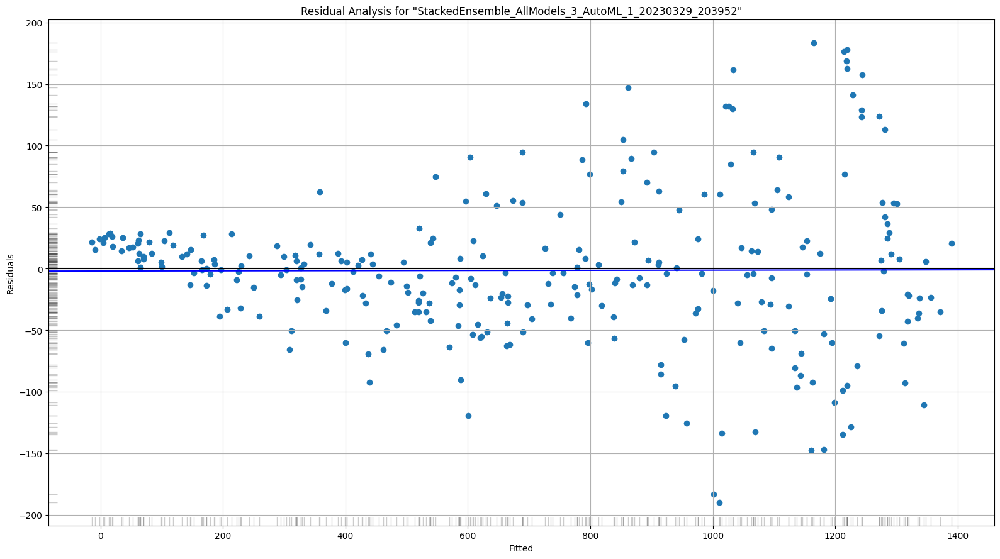

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

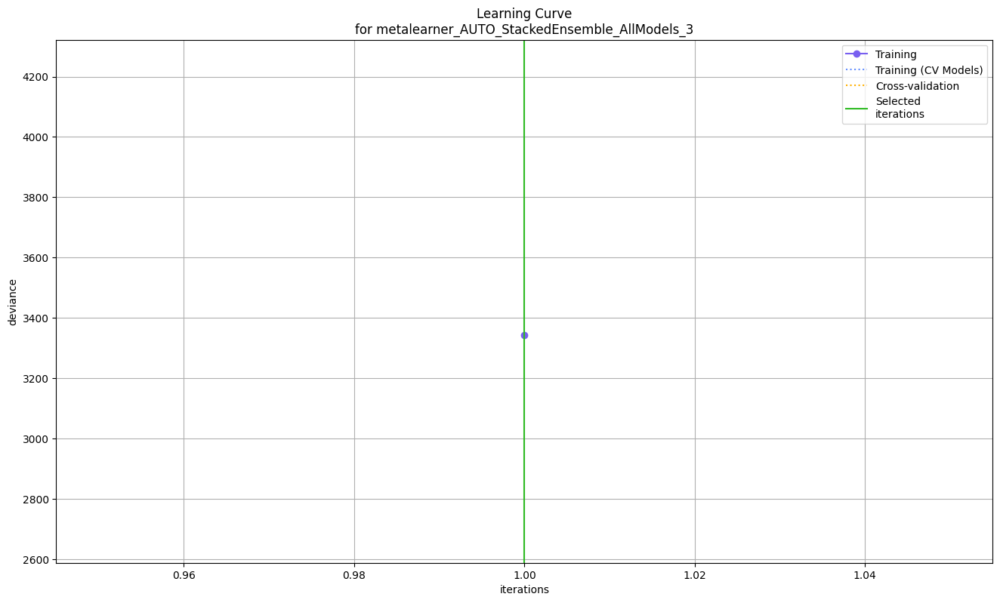

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

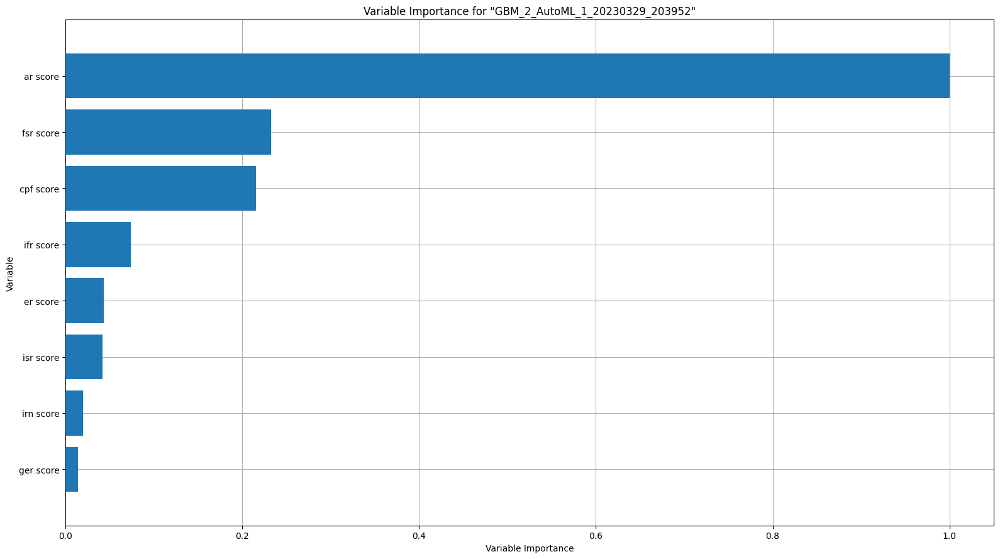

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

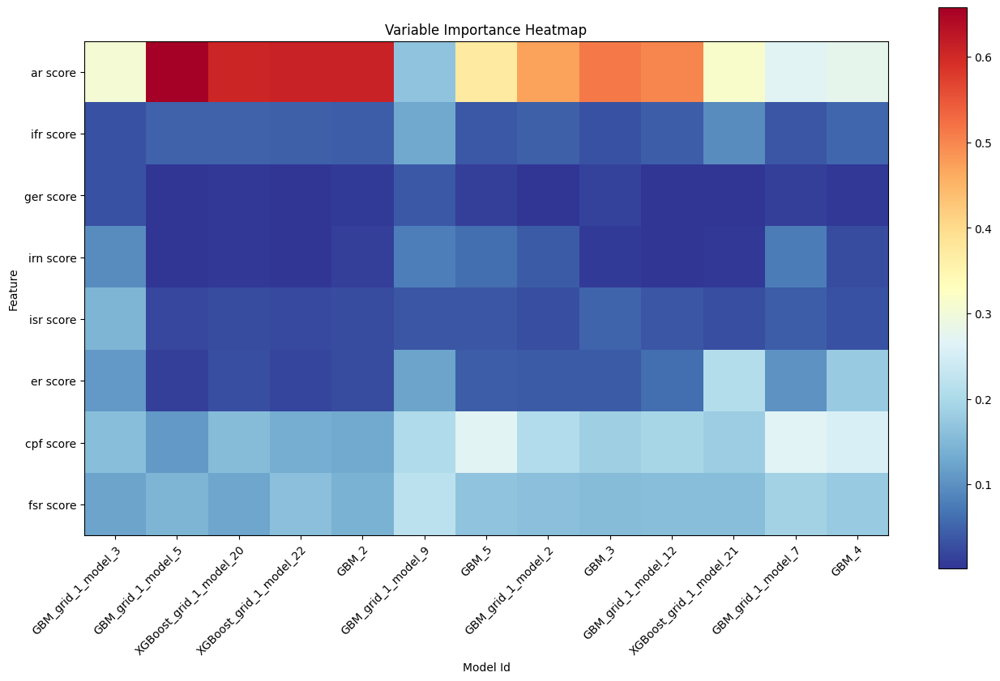

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

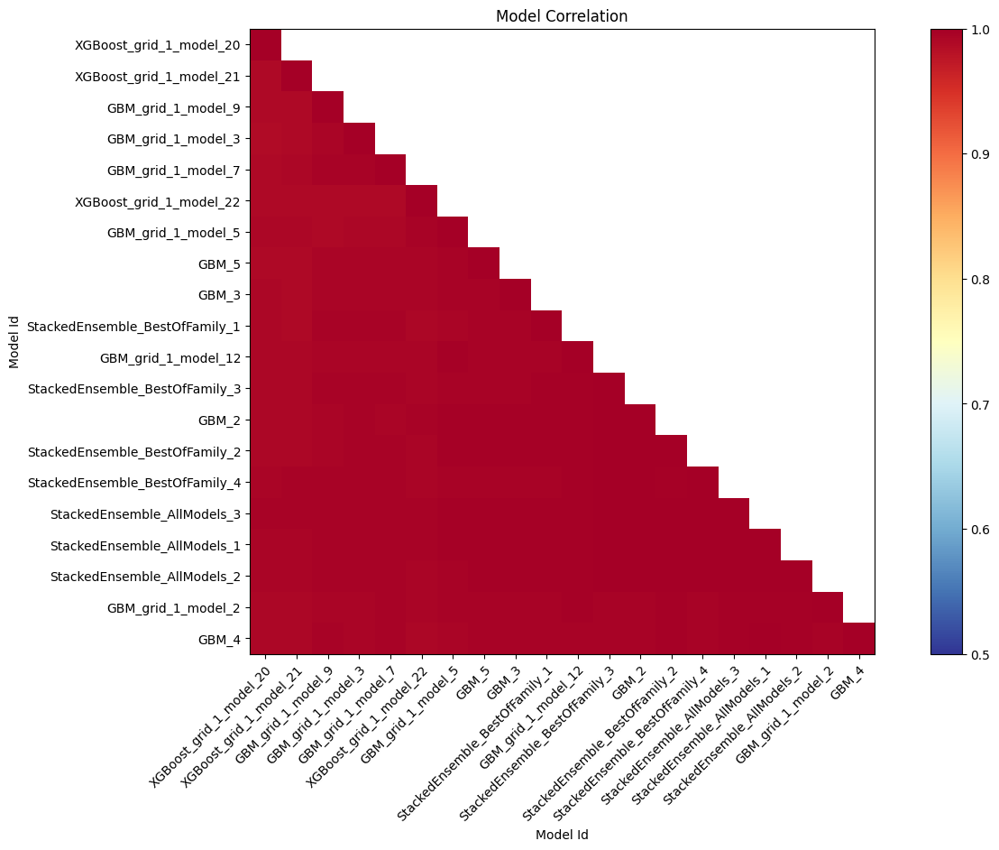

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

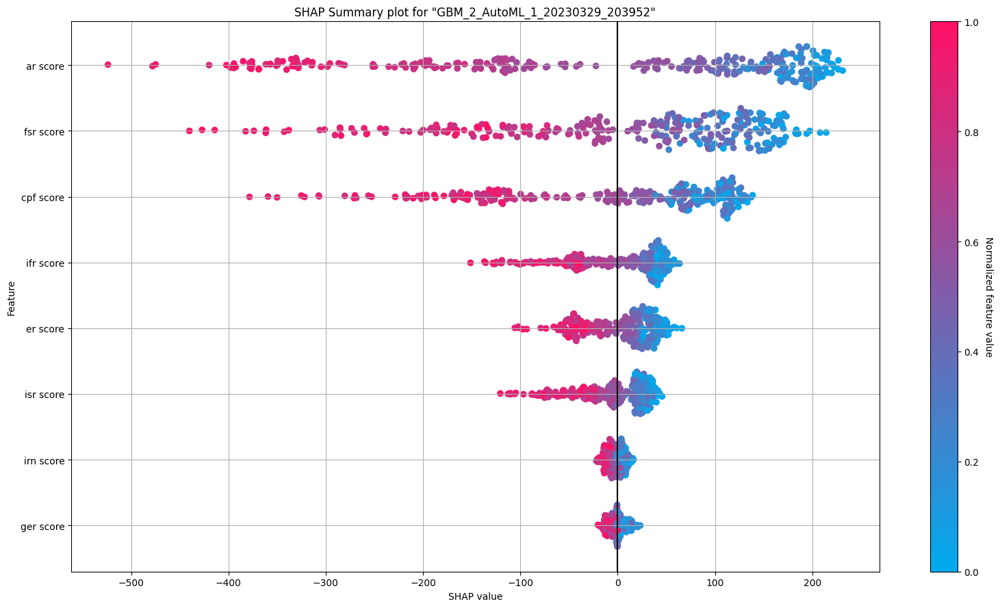

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

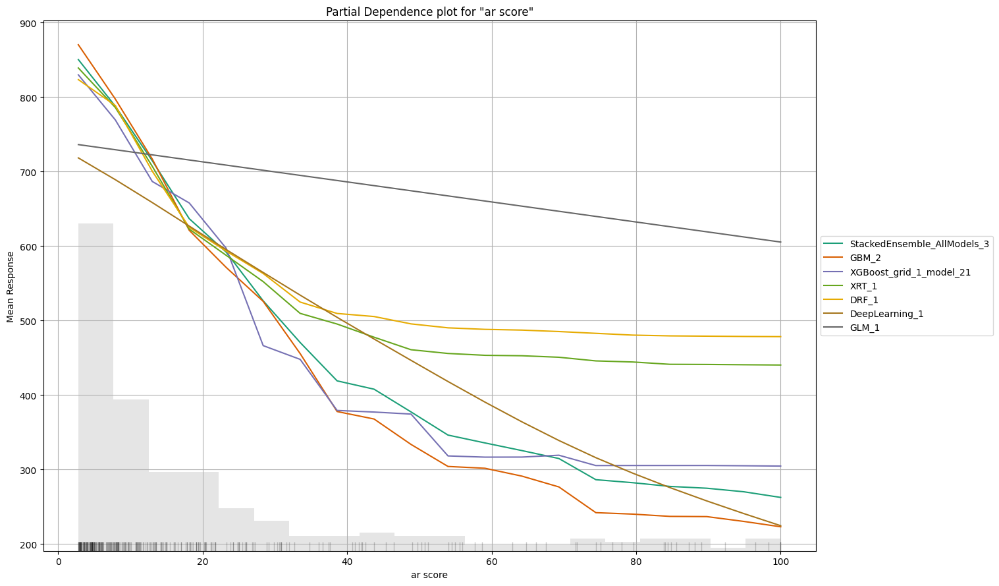

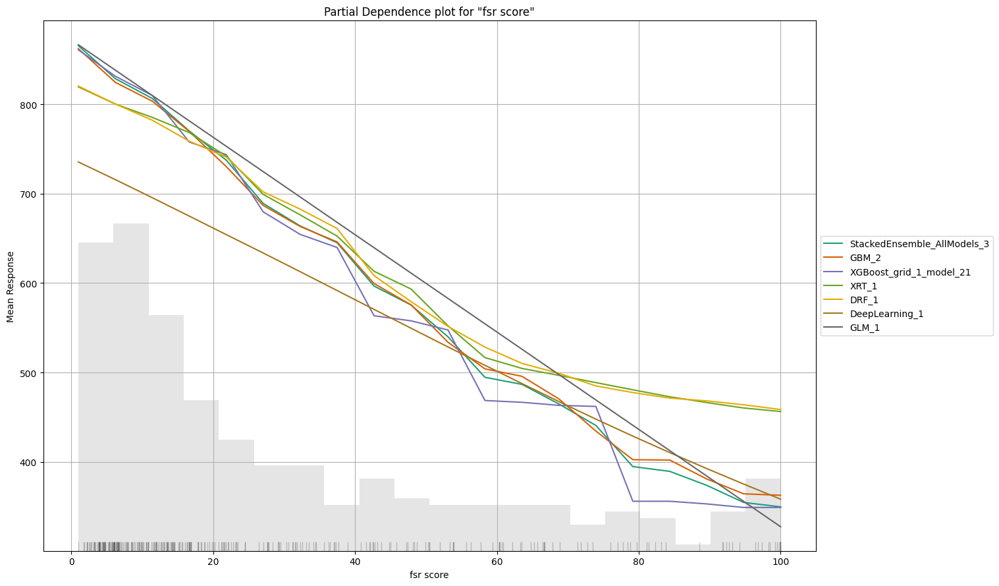

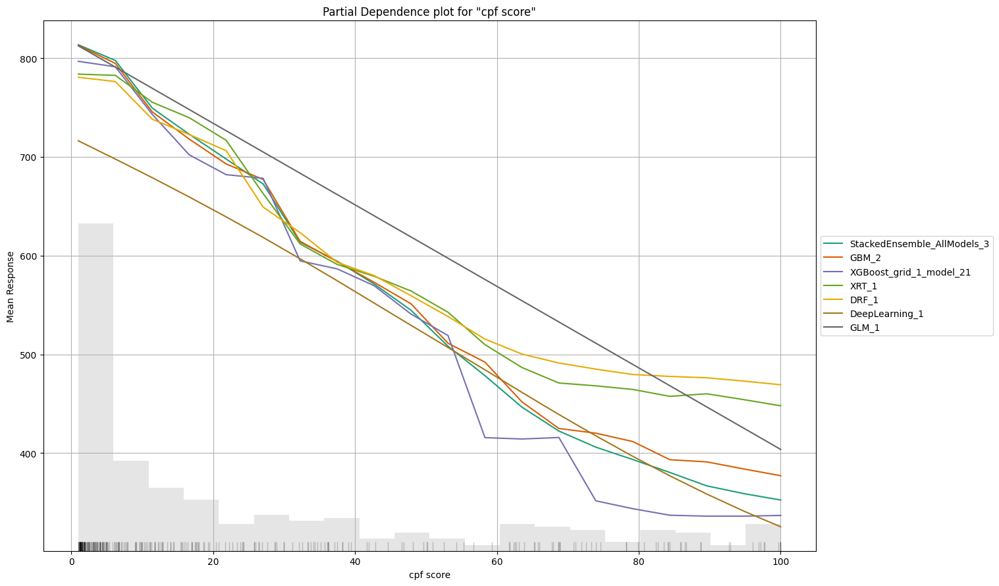

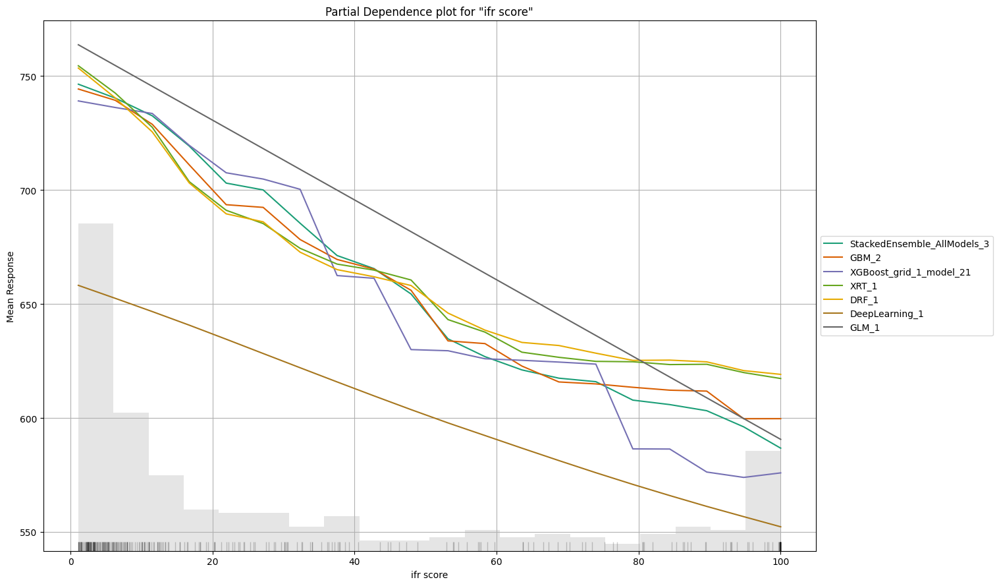

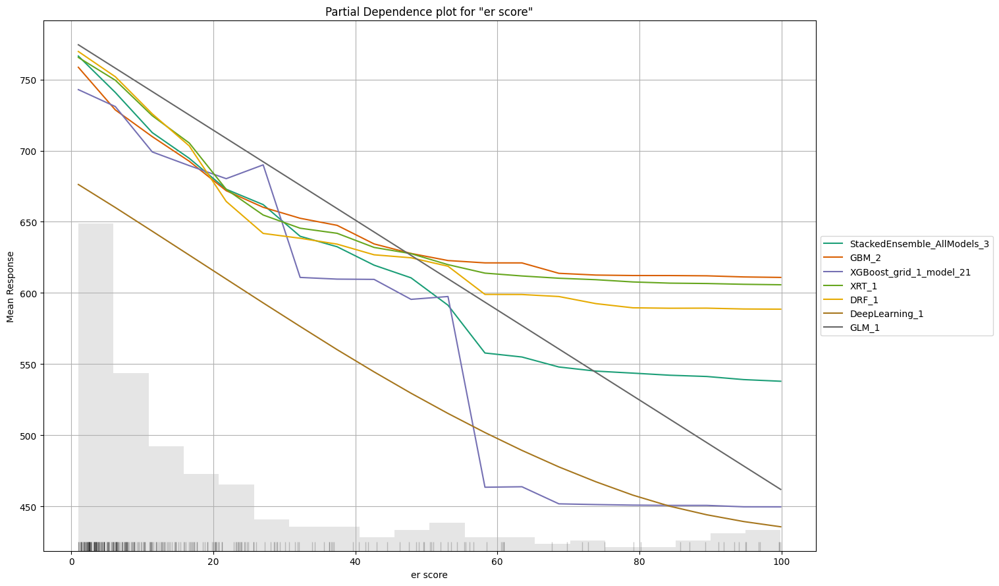

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

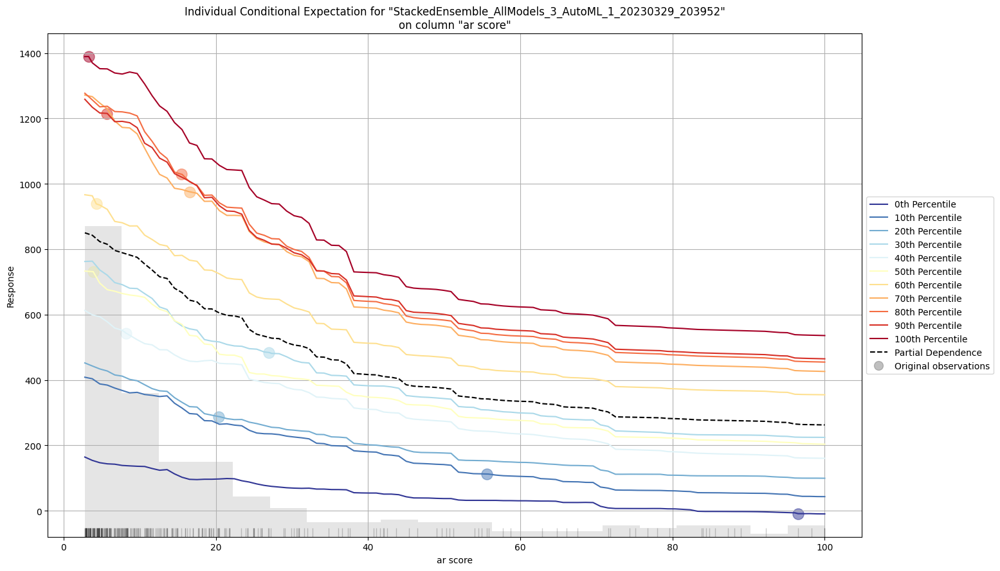

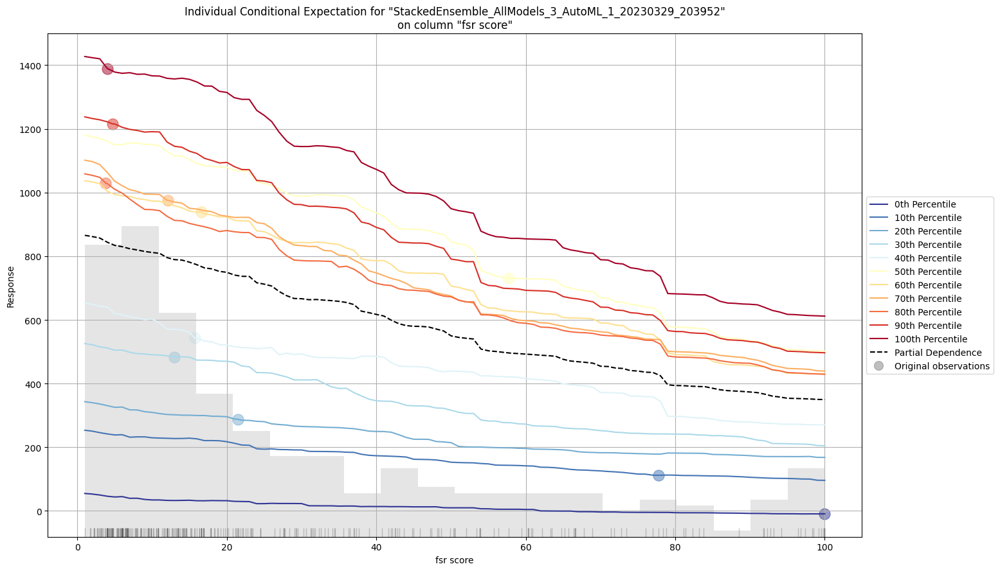

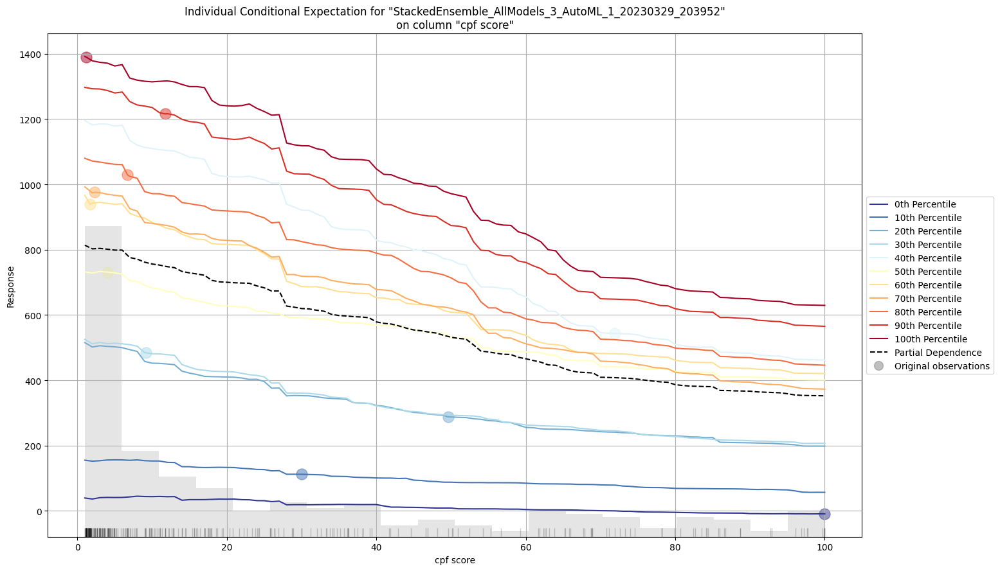

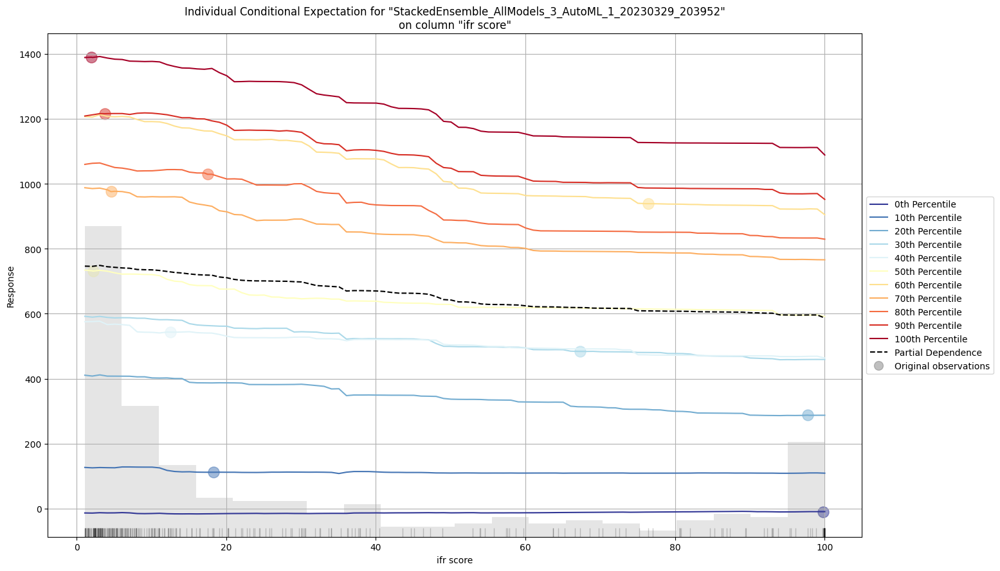

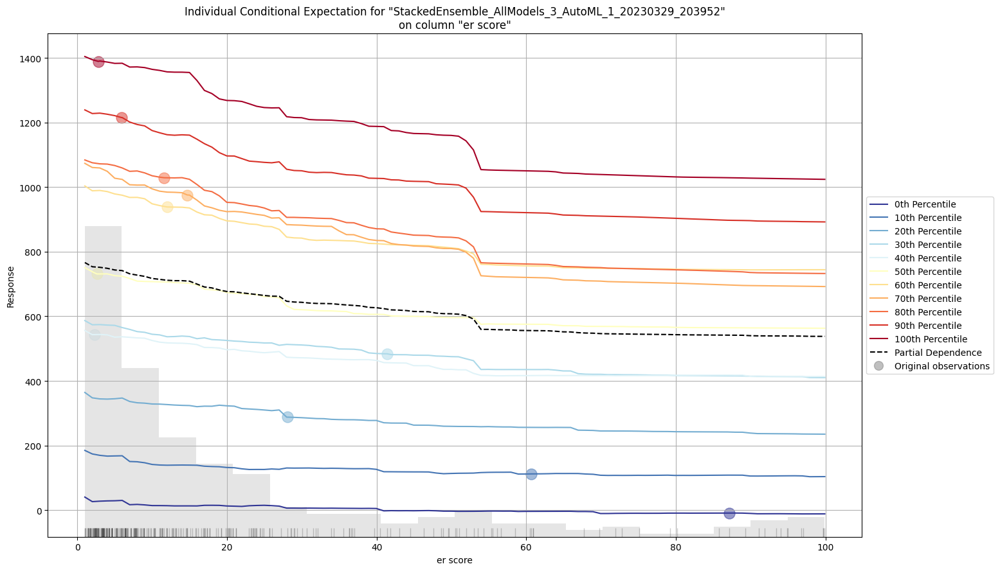

In [ ]:
exa = aml.explain(df_test)

**Residual Analysis:**

- The residuals are normally distributed and the model is making accurate predictions.
- Random scatter of data points around the horizontal zero line and no 
discernible pattern or trend in the residuals plot.
- Residuals signify that residuals don't have heteroscedasticity.

**Variable Importance**
- In the variable importance plot we can observe that the plot replicates the results which we got from the Linear Model and Tree-Based Model above. The variable importance has been scaled between 0 to 1 for ease of understanding.
- The feature, ar score being the most important one.

**SHAP Summary:**
- The importance of each feature is ranked based on its contribution to the prediction, with ar score being the most significant, followed by fsr score, and so on.
- Further analysis of the distribution of SHAP values for the ar score feature reveals that extreme values at both ends of the spectrum have a significant effect on the Rank.
- Provides insights into the relative importance of features in the model and their impact on the prediction.
- Importance of each feature is ranked based on its contribution to the prediction.
- SHAP value axis indicates whether a feature has a positive or negative impact on the prediction.
- Color of the dot represents the impact of the feature value on the prediction.
- SHAP analysis provides a more accurate and interpretable way of understanding the behavior of complex models.

**Partial Dependence Plot (PDP):**
- Looking at the PDP for the ar score, we can see that as this feature increases, the mean response (i.e., the university's rank) also increases. This suggests that the range of values for the ar score might be an important factor in determining a university's ranking. Similarly, the PDP for the fsr score shows that as this feature increases, the mean response of quality also increases. Therefore, we can interpret this range as another deciding factor in a university's ranking.
- A graphical tool that allows us to examine the marginal effect of a feature on the target variable.
- Shows how much the target variable changes as we vary the value of a single feature while holding all other features constant.
- Can be useful for interpretation purposes, as we can identify which features have the greatest impact on the target variable.

**ICE (Individual Conditional Expectation) Plot:**
- By examining the ICE plot, we can see that while the rank of some universities remains unchanged when the ar score and fsr score values increase, the rank of other universities increases significantly. Therefore, the ICE plot provides a more nuanced understanding of the relationship between features and model output.
- Shows the effect of a feature on a particular instance.
- Provides a more detailed analysis of the relationship between a feature and a model's output.
- Each line in an ICE plot represents the predictions for one instance when we vary the feature of interest.
- ICE plot provides a more nuanced understanding of the relationship between features and model output.
- More intuitive than PDP plots.

#### **Linear and Tree-Based Models**

##### Linear Regression Model


In [ ]:
import shap

In [ ]:
# Sample 100 examples for SHAP analysis
x_train_100 = shap.utils.sample(x_train, 100)
x_test_100 = shap.utils.sample(x_test, 100)


In [ ]:
# Computing SHAP values using the linear regression model
lr_explainer = shap.Explainer(lr.predict, x_train_100)
lr_shap_values = lr_explainer(x_train)


Exact explainer: 1138it [00:29, 23.69it/s]                          


##### Tree-Based Model


Here the x-axis is the feature and the y-axis is the output as we vary the feature. The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.

Let us take a feature of ar score

- For Tree-based model the cross is made at approx E[f(x)] 780

So as the ar score decreases the expected value also decreases or vice versa.

Talking about the red line on the plot - When we give a sample as an input (sample_ind = 18) as an input to check the output. By plotting this we can see the difference between the model output from the expected value.

In [ ]:
# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(rf.predict, x_train_100)
tree_shap_values = tree_explainer(x_train)


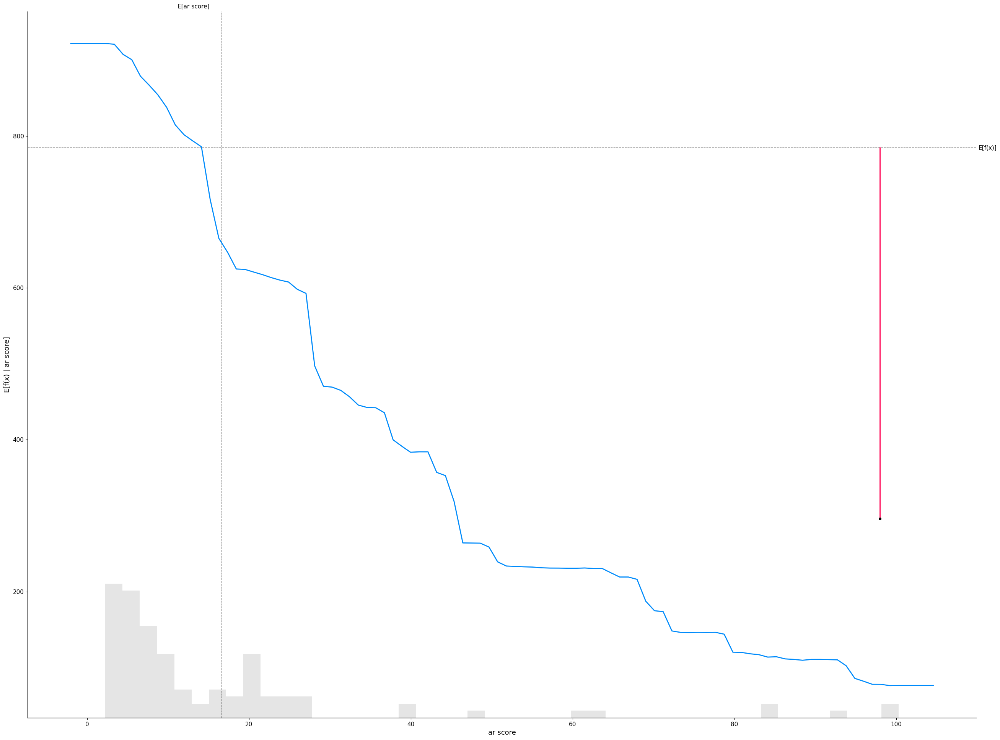

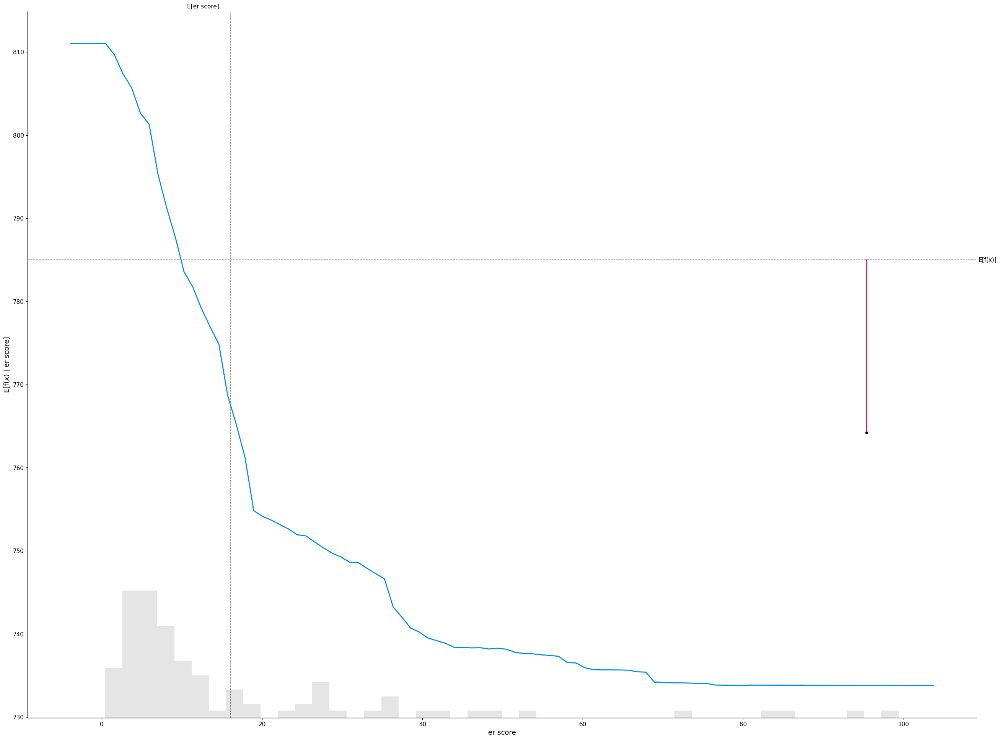

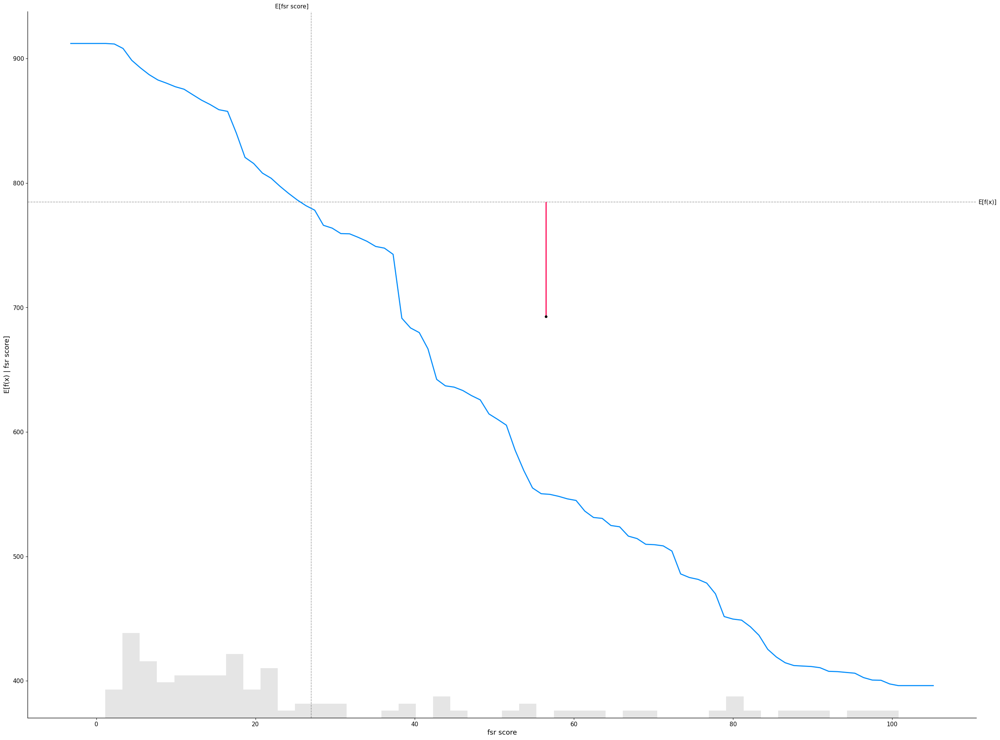

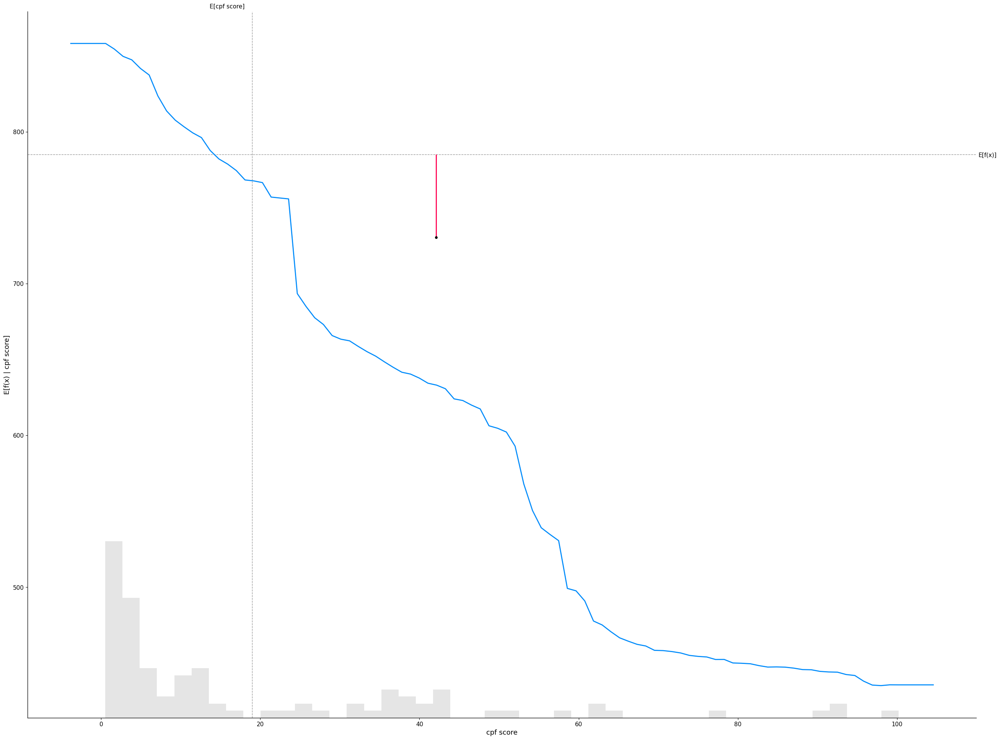

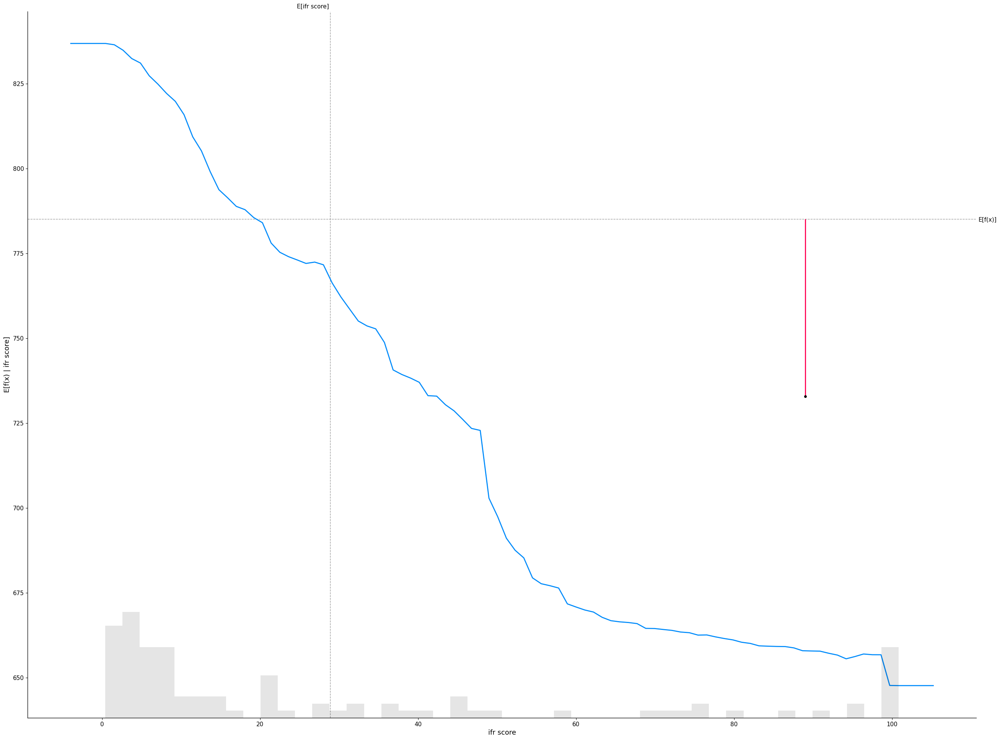

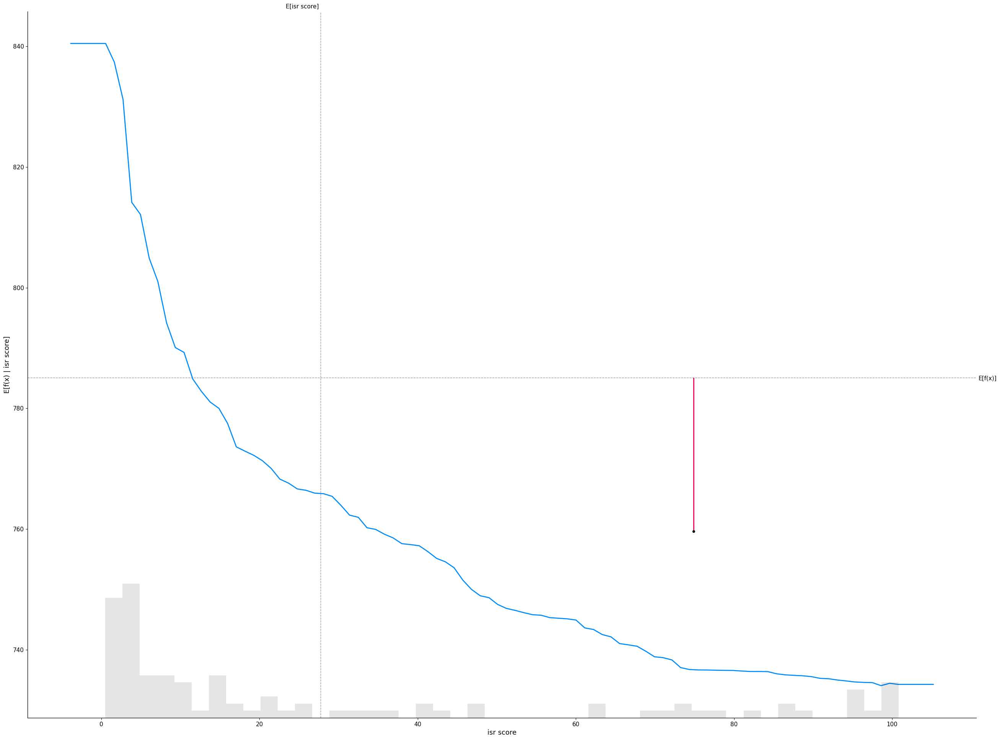

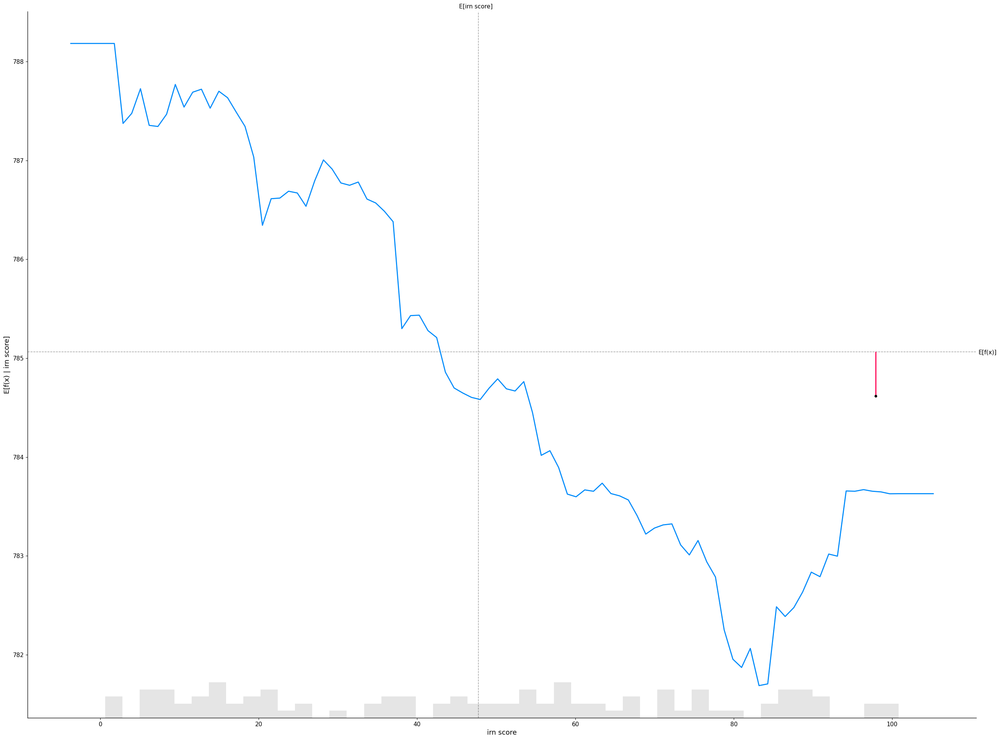

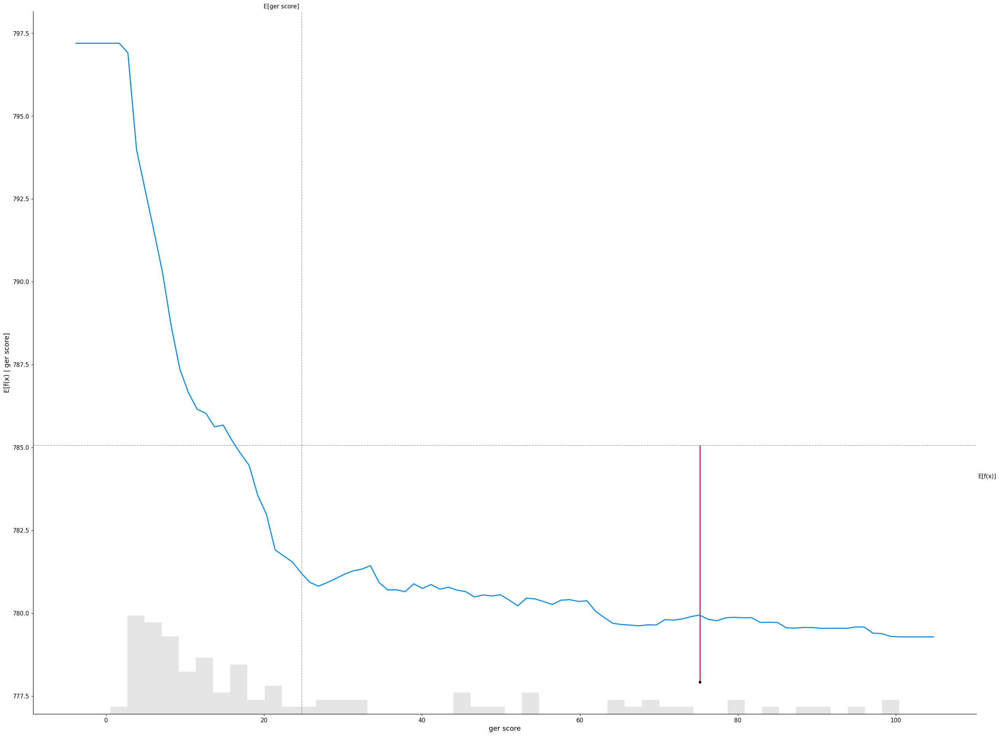

In [124]:
for i in x_train.columns:
    # making a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        rf.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

# Interpreting SHAP Feature Importance Plot for Linear and Tree-based model

The idea behind SHAP feature importance is simple: Features with large absolute Shapley values are important. Since we want global importance, we average the absolute Shapley values per feature across the data. Next, we sort the features by decreasing importance and plot them.

The following plots are

- SHAP feature importance for a linear model
- SHAP feature importance for tree-based model

As we can see below in the plots, there is a difference in feature importance for both the models

- For the linear model, fsr is the most important feature but,
- For our tree-based model ar is the most important feature when we consider the average of SHAP values to calculate feature importance.

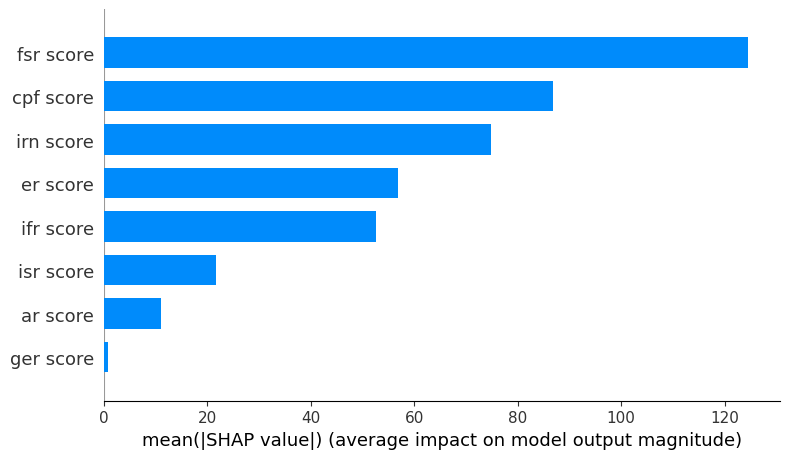

In [ ]:
# Linear Regression Model
lr_shap_explainer = shap.LinearExplainer(lr, x_train, feature_dependence="independent")
lr_shap_values = lr_shap_explainer.shap_values(x_train)
shap.summary_plot(lr_shap_values, x_train, plot_type="bar")


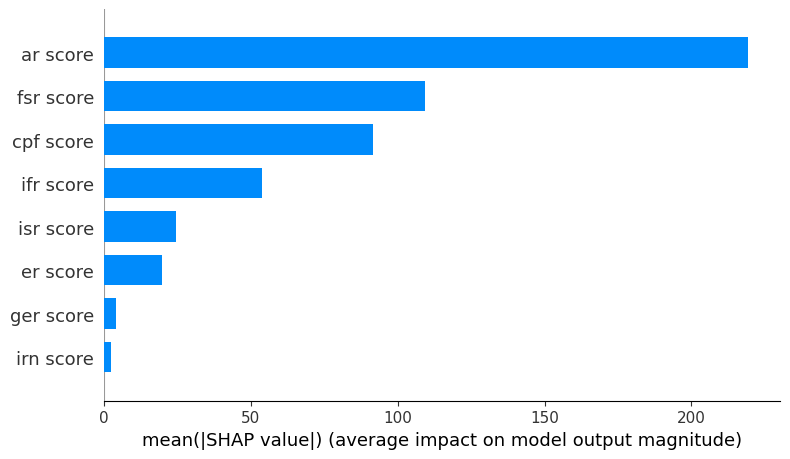

In [ ]:
# Random Forest Model
rf_shap_explainer = shap.TreeExplainer(rf)
rf_shap_values = rf_shap_explainer.shap_values(x_train)
shap.summary_plot(rf_shap_values, x_train, plot_type="bar")


# **Interpreting Waterfall SHAP visualization**

**Linear Regression Model**
- It says that f(x) = 568.113 is what we got as a model output and the expected output for this sample was 990.961. The waterfall model explains how we got the expected output, and which features contributed to what. The below graph shows that er score has the most negative impact in decreasing the rank of university, for this specific sample. 

- Considering fsr score which had a positive impact and it bought the rank of university up for this sample, and so on. Using this model we can visually interpret why exactly this specific sample is giving an output of 568.113.

**Tree-Based Model**
- Similarly we can interpret the tree-based model for the same sample.
Where the output we got was -226.708 and the expected output was 123.858. in the tree-based model, we just see that the magnitude of the impact made by individual features varies from what we had in a linear model. Here in the tree-based model, the output is equally determined by the features - The below graph shows that ar score has the most negative impact in decreasing the rank of university, for this specific sample..

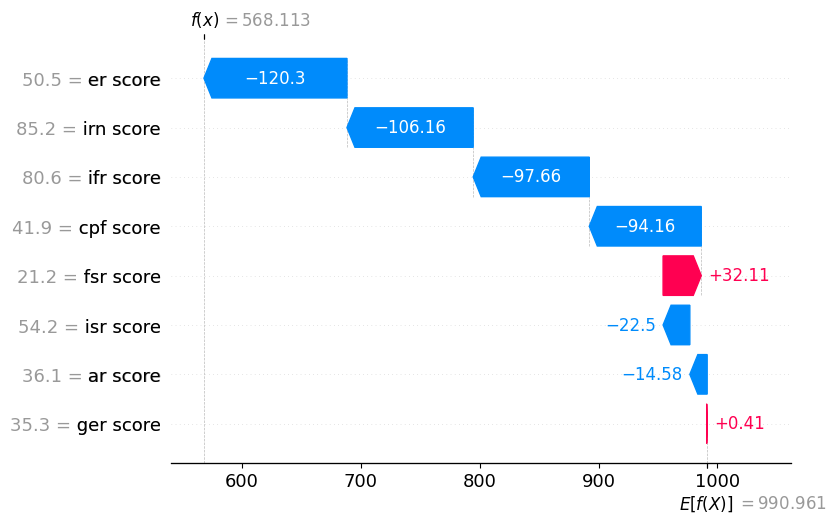

In [ ]:
# Linear Regression Model
# SHAP waterfall plot
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(12,8))
shap.waterfall_plot(shap.Explanation(values=lr_shap_values[0], base_values=lr.predict(x_train_100)[0][0], data=x_train.iloc[0], feature_names=x_train.columns), max_display=15)

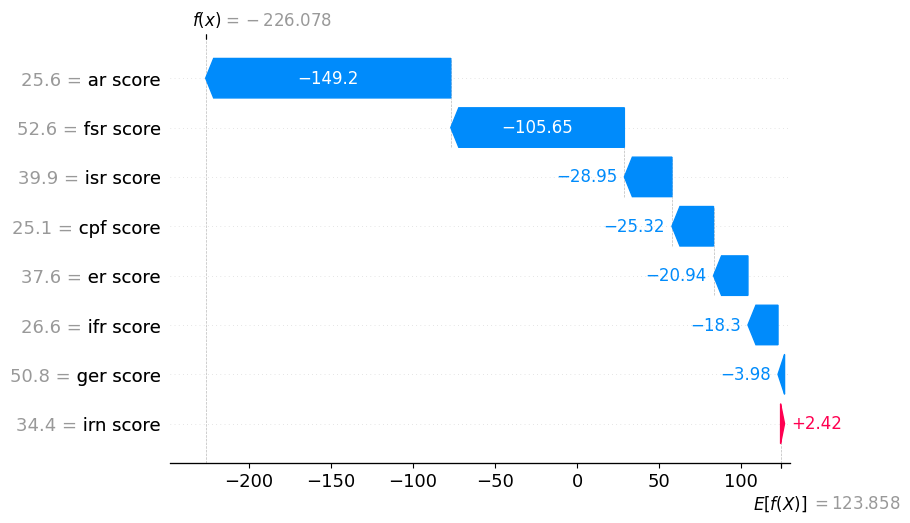

In [ ]:
# Tree-Based Model
# SHAP Explanation object for the third instance in the train set
sample_ind = 3  # third instance
shap_exp = shap.Explanation(values=rf_shap_values[sample_ind], base_values=rf.predict(x_train_100)[sample_ind], data=x_train.iloc[sample_ind], feature_names=x_train.columns)

# Plotting the SHAP waterfall plot
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(12,8))
shap.waterfall_plot(shap_exp, max_display=15)


#**Interpret the summary plot for the Linear and Tree-based model**

Here the features are listed in descending order of their importance. This is one of the easiest ways to analyze an ML model and how the features are affecting the target and to what extent.

- Each dot(both red and blue) represents a feature of determination of rank.
- Red color represents high values whereas blue color represents low value
- If a dot(feature of determination of rank.) is on the right side of the y-axis then it had a positive impact and if it is on the left side of the axis it had a negative impact
- The position of a dot(feature of determination of rank.) on the x-axis represents the intensity of impact it had, the more it is away from the axis greater the intensity.

Let us try to understand how both models are performing side by side

- Higher value of fsr tends to have a negatice impact on the rank of university
- Lower values of fsr score tend to have a positive impact on the rank of university.
- Lower value of irn tends to have a positive impact on the rank of university

We could also interpret the intensity of impact

- Higher amount of fsr score have a much negative impact on the rank of university but it doesn't really care if the value is low it will always have the same intensity of negative impact on the rank

This visualization is very useful when it comes to interpreting how our model is working.

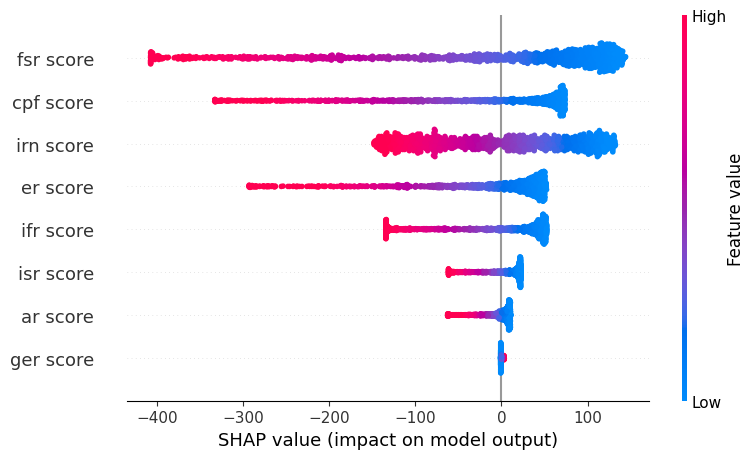

In [ ]:
# SHAP summary for Linear Model
shap.summary_plot(lr_shap_values, x_train)
    

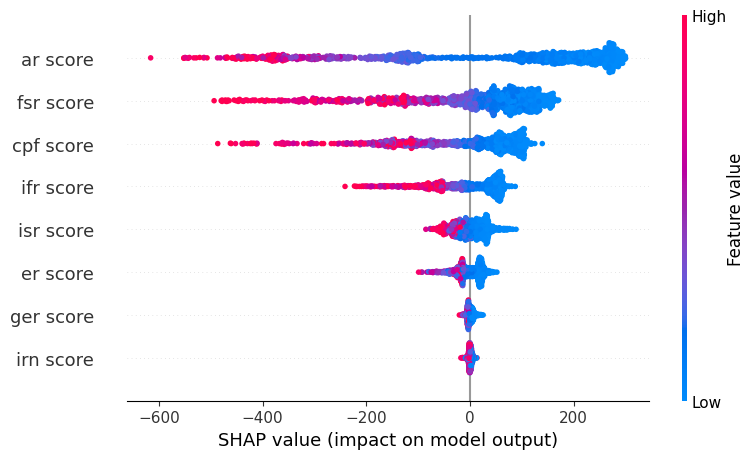

In [ ]:
# SHAP summary for Tree-Based Model
shap.summary_plot(rf_shap_values, x_train)
    

# **Interpreting SHAP dependence plot for Linear and Tree-based model**

The SHAP dependence plot shows the marginal effect one or two features have on the predicted outcome of a machine learning model. It tells whether the relationship between the target and a feature is linear, monotonic, or more complex. Let us interpret the linear and Tree-based models using the SHAP dependence plot. Here in these graphs, we get a dot for every university in our dataset.

- As we can observe the linear model feature and its SHAP value have a linear relationship. If a feature has a positive impact on the rank of university then the relationship will be directly proportional e.g. ger and if the feature harms rank of the university the relationship will be inversely proportional. e.g. ar score and er score.

- For the tree-based model as observed the relationship between feature and its SHAP value is no longer linear. Now we see that the SHAP dependence plot no longer exactly matches the partial dependence plot because they are accounting for the interaction effects. Because if we look at the PDP, we are losing all the high order interaction (and's and or's) in the model that our model may be doing. But unlike PDP, the SHAP defense plot takes these interactions into account.

Example of SHAP dependence plot of er score

- In the linear model the relationship is linear between er score and its SHAP values. There is not much information to extract from these plots the only information which could be extracted is if the relationship is directly or inversely proportional.
- In the tree-based model we could extract the information on how the rank of each university is affected while being tuned the feature. It also reinforces the inference we got from the above PDP and ICE plot i.e. The rank of university in the range (30 - 80) changes drastically.

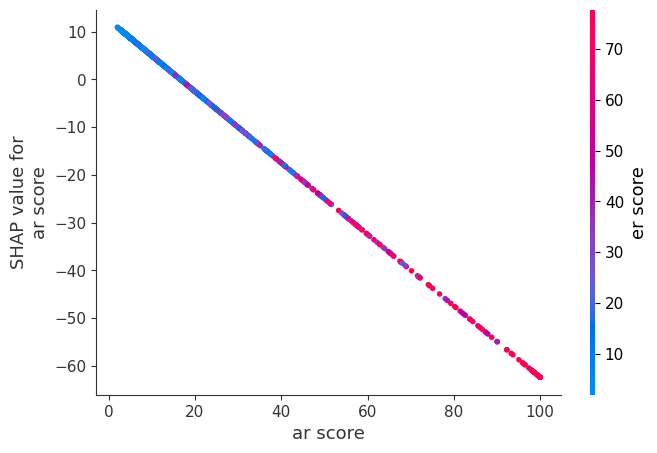

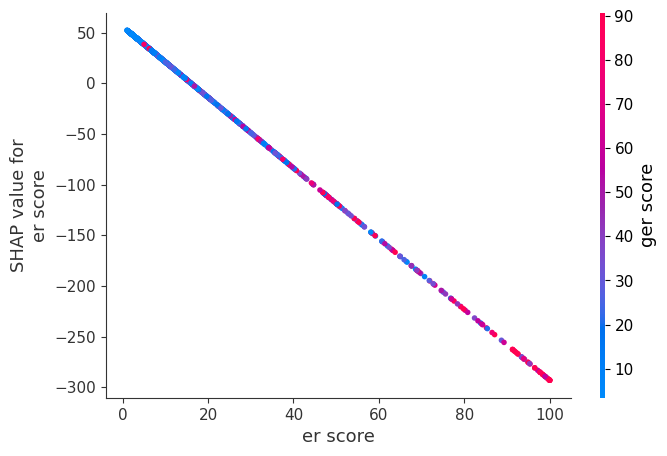

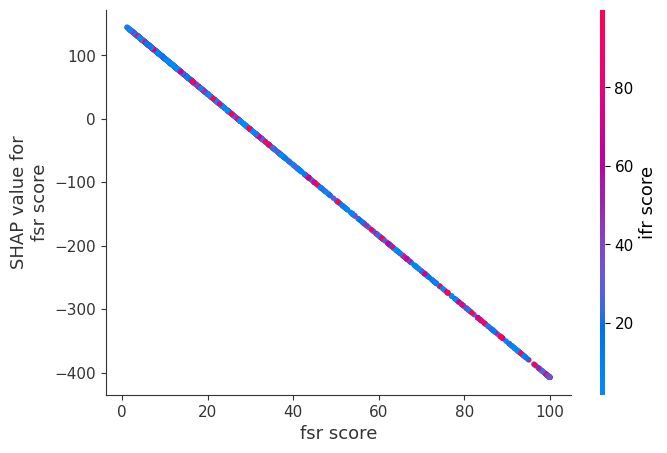

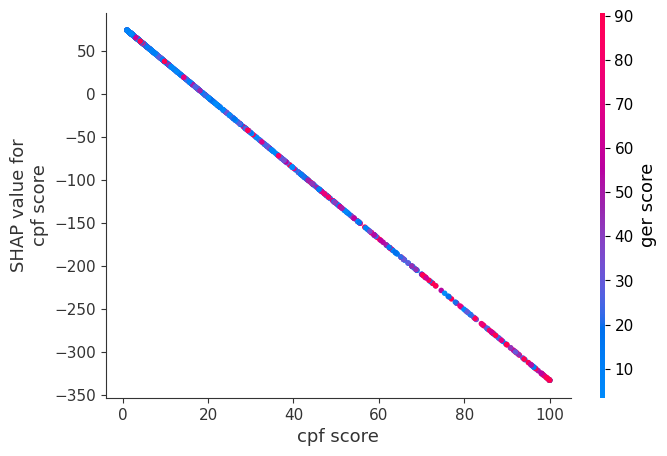

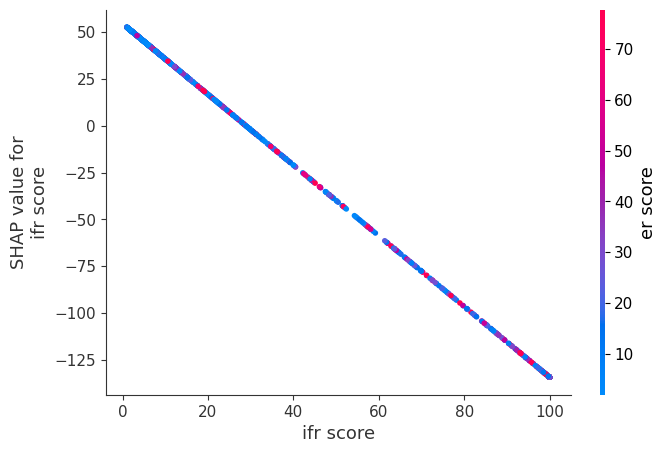

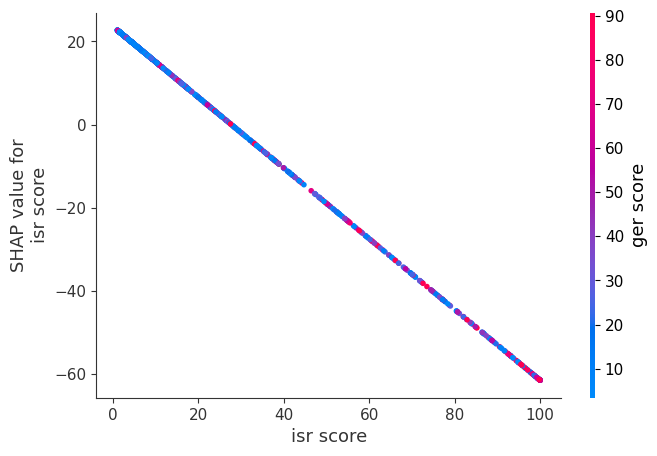

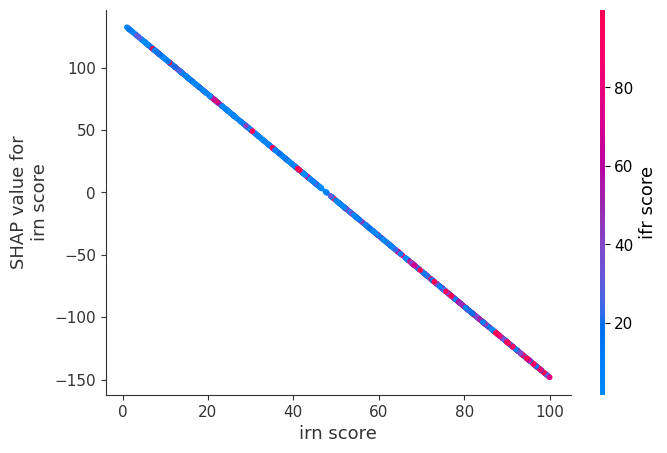

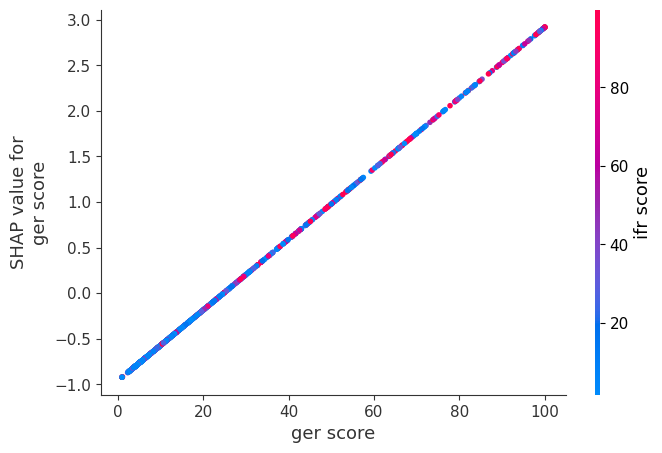

In [ ]:
# SHAP partial dependence plot for Linear Regression Model
for i in x_train.columns:
    shap.dependence_plot(i, lr_shap_values, x_train)
     

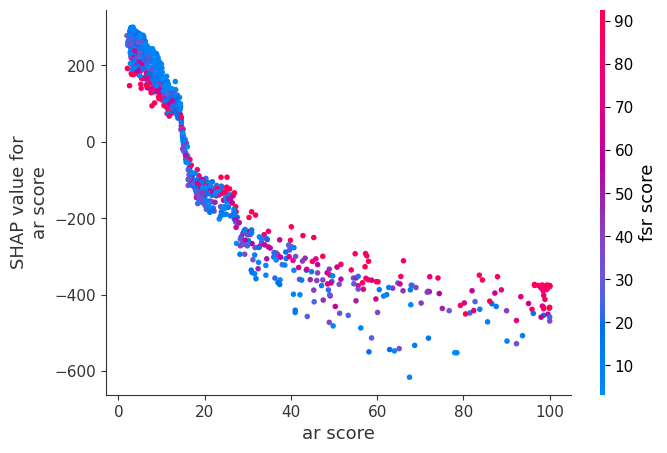

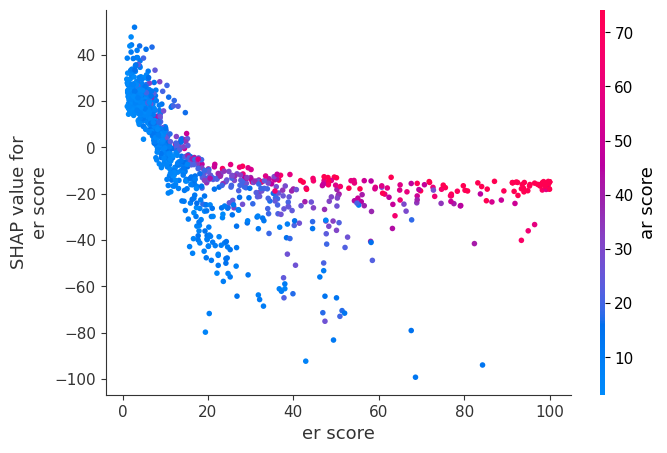

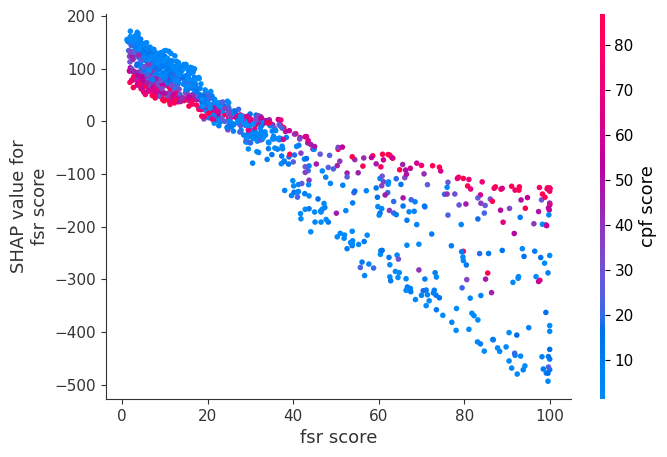

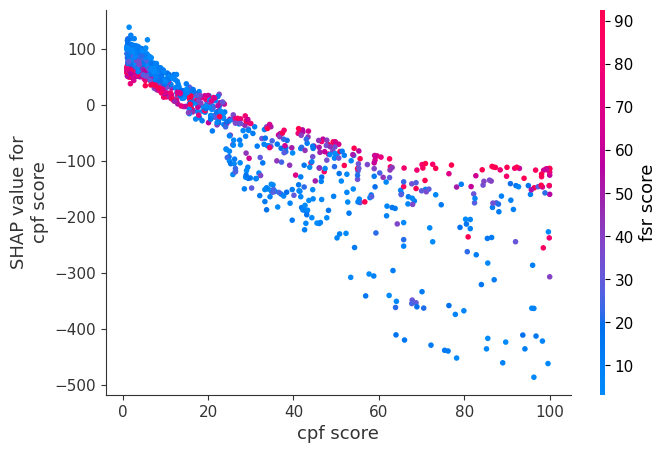

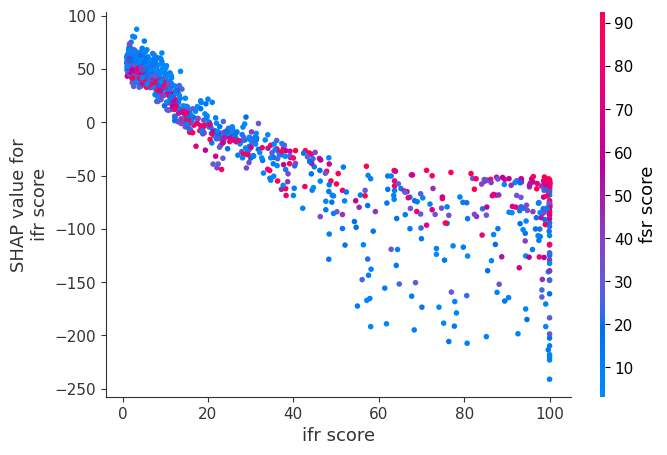

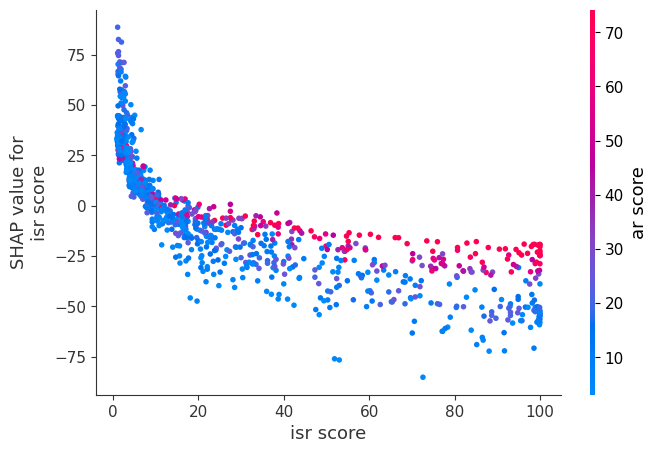

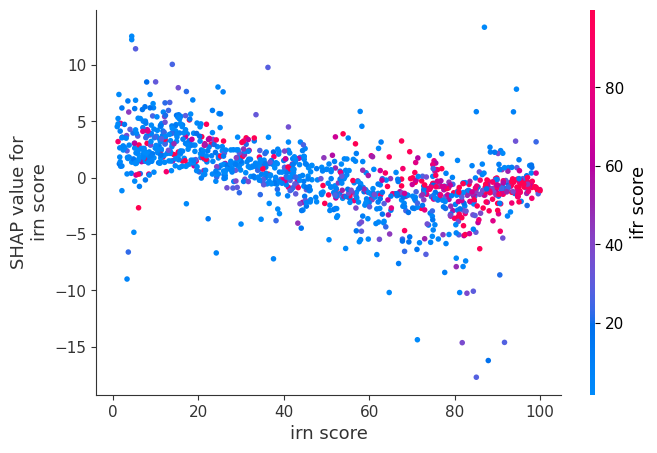

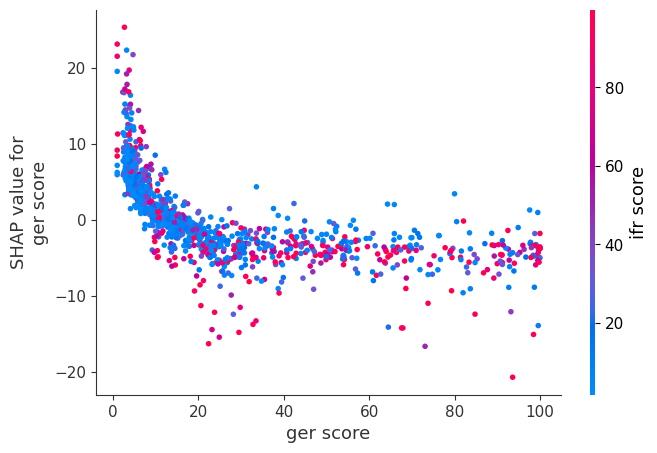

In [ ]:
for i in x_train.columns:
    shap.dependence_plot(i, rf_shap_values, x_train)
   

In [ ]:
X_output_linear = x_test.copy()
X_output_linear.loc[:, "predict"] = np.round(
    lr.predict(X_output_linear), 2
)  # Attaching the output of linear model to test dataframe

X_output_tree = x_test.copy()
X_output_tree.loc[:, "predict"] = np.round(
    rf.predict(X_output_tree), 2
)  # Attaching the output of tree based model to test dataframe
   

This allows us to compare the actual values of the target variable with the predicted values of each model for the same set of instances. We can then use various evaluation metrics to compare the performance of the two models and determine which one is more accurate in predicting the target variable for new, unseen instances.

In [ ]:
# Force Plot of Tree Based Model
explainerModel = shap.TreeExplainer(rf)
shap_values_Model = explainerModel.shap_values(X_output_tree)


def shap_plot_tree(j):
    p = shap.force_plot(
        explainerModel.expected_value, shap_values_Model[j], X_output_tree.iloc[[j]]
    )
    return p
     

# **Force Plot SHAP analysis**

This plot is the same as the waterfall model which we saw above the only difference is the visualization is condensed. It is really up to an individual which visualization is preferred some find this easier to read others find the waterfall model easier to read

In [ ]:
shap.initjs()  # Initializing JavaScript module
print(shap_plot_tree(5))  # SHAP force plot for sample 5
  

# **Heatmap Visualization for Linear and Tree-based model**

This visualization is a summarization of the entire dataset on how each data point in every feature is affecting the target(rank of university).

- Here the Y-axis is Features and X-axis is Instance of that feature
- The color of the instance defines if it had a positive effect or negative effect by its color. If the instance is red then it had a positive effect and if the instance is blue then it had a negative effect
- The intensity of the color is directly proportional to the intensity of the effect. Deeper the color, the more impactful the feature is

**Linear Regression Model** - fsr score

**Random Forest Model** - ar score

##### Linear Regression Model

Exact explainer: 1138it [00:14, 34.25it/s]                           


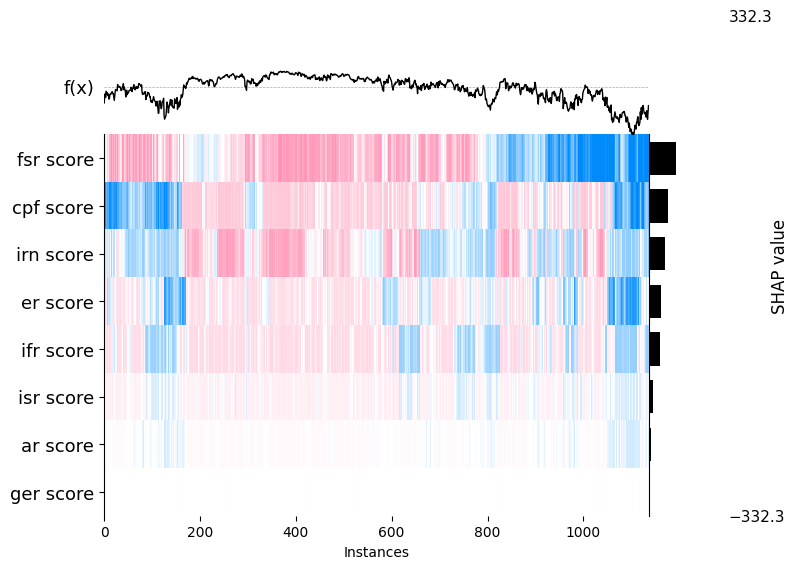

In [ ]:
# Creating a SHAP explanation object
lr_explainer = shap.Explainer(lr.predict, x_train)
lr_shap_values = lr_explainer(x_train)

# Creating a SHAP heatmap
shap.plots.heatmap(lr_shap_values)

##### Random Forest Model

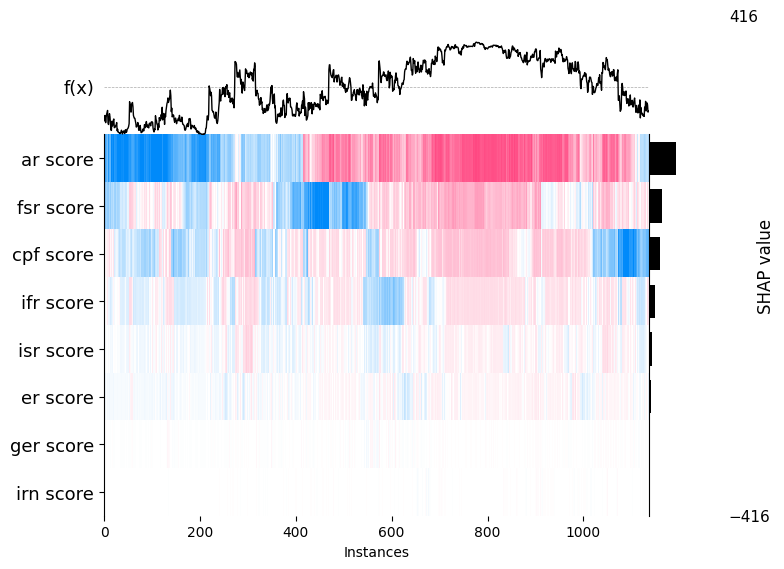

In [ ]:
# Creating a SHAP explanation object
explainer = shap.Explainer(rf)
shap_values = explainer(x_train)

# Creating a SHAP heatmap
shap.plots.heatmap(shap_values)

# **LIME (Local Interpretation Model-Agnostic Explanation) Analysis**

- LIME builds a surrogate model, i.e. converts a more complicated model (say a deep tree-based model into a simple linear model) around the data points in which we are interested and then it will try to make an approximation out of this simple model on the whole model. LIME builds a local model in such a way that it can interpret the whole Black-Box

- LIME works well on tabular, text, image datasets - hence it works on different datasets

Let us Interpret our Linear model and Tree-based model on sample data using LIME and try to understand what is happening under the hood. Please refer below for Visualizations of both models

- As we can see on the left-hand side LIME gives us information about the minimum and maximum values predicted by the model. The Color orange here represents positive and blue represents negative
- **fsr score and cpf score had a positive effect on the rank of university in both models**
- **ifr score and isr score had a negative effect in the linear model but positive in tree-based model**

These interpretations were carried out locally in the region where of out sample data.

In [ ]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 5.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283859 sha256=baf2b07e8337ef4a8702bed61e49f757991f85efd32c101801d1669ef0fc590e
  Stored in directory: /root/.cache/pip/wheels/ed/d7/c9/5a0130d06d6310bc6cbe55220e6e72dcb8c4eff9a478717066
Successfully built lime


In [ ]:
import lime
from lime import lime_tabular
from lime.lime_tabular import LimeTabularExplainer

##### Linear Regression Model

In [ ]:

# Initializing LIME explainer for Linear Model
lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [ ]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", lr.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], lr.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation

Prediction :  [[648.00068122]]
Actual :      [648.]


In [ ]:
lime_linear_explanation.show_in_notebook()  # Display Results in Notebook

##### Random Forest Model

In [ ]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [ ]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", rf.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], rf.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation
     

Prediction :  [502.60721861]
Actual :      [648.]


In [ ]:
lime_tree_explanation.show_in_notebook()  # Display Results in Notebook

# **PDP(Partial Dependence Plot) for Linear model and Tree-based Model**

- **Linear Regression Model** - If we closely look at the PDP of the linear model we can see that if features ar score and fsr score are tuned while freezing the rest if them the output of the model varies linearly and these variables have the most significant effect on the output(rank of university) 

- **Tree-Based Model** - On looking at the PDP of the tree-based model, it re-affirms the interpretation we got from the PDP of the Linear Model and Best AutoML model. The only difference here is that the output doesn't vary linearly



##### Linear Regression Model

In [104]:
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence

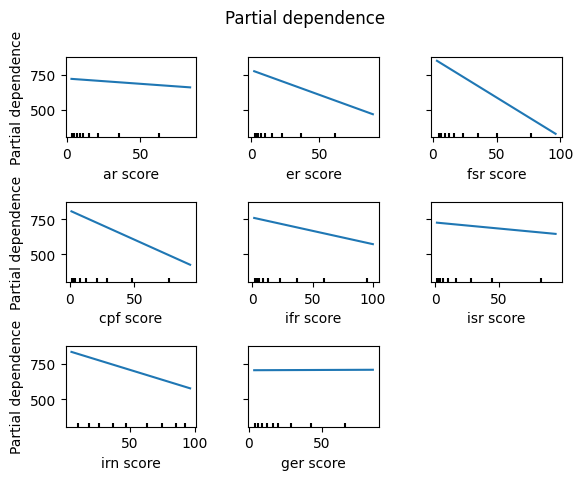

In [106]:
# PDP Plot for Linear Model
PartialDependenceDisplay.from_estimator(lr, x_test, x_test.columns )
fig = plt.gcf()
fig.suptitle("Partial dependence")
fig.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (32, 24)

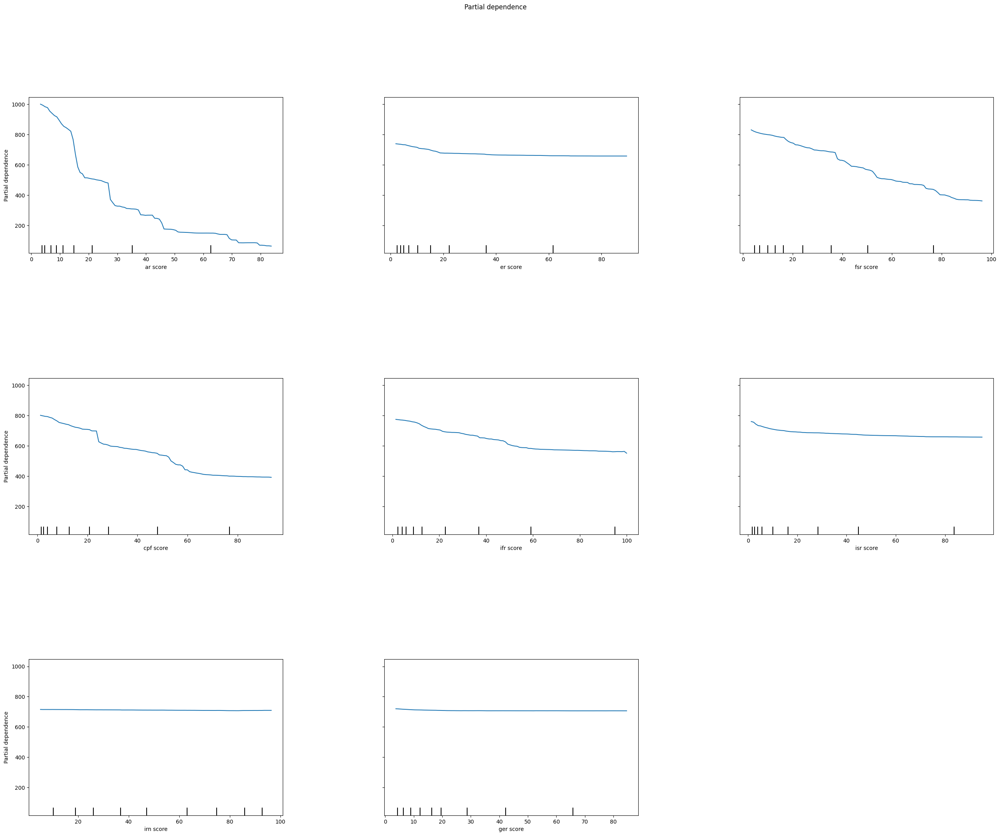

In [107]:
# PDP Plot for Tree based Model
PartialDependenceDisplay.from_estimator(rf, x_test, x_test.columns )

fig = plt.gcf()
fig.suptitle("Partial dependence")
fig.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (32, 24)

# **Comparision between SHAP, LIME, and Partial Dependence Plot Analysis**



The purpose of model interpretability is to understand and explain how a machine learning model works and how it makes predictions or decisions. Interpretability is important because it helps to build trust in the model and its predictions, and it enables users to identify and correct errors, biases, or limitations in the model.

Unlike LIME, SHAP does not necessarily build a local interpretable model but rather uses the black-box model to calculate the marginal contribution to the prediction for each feature and then relies on the theoretically sound game theory concept of Shapley values to calculate the feature importance. In this way, SHAP improves upon LIME due to its greater stability and lack of local linear model assumptions.

- PDP gives the extent of effect a variable has on the output by freezing the rest of them - **In our case: ar score being the most important feature followed by fsr score**

- SHAP gives how much each variable contributes to the prediction - **As we analysed by the negative or positive impact ar score and fsr score had on the rank of the university.**

- LIME is more like SHAP but a lite version of it - It takes the local region of the point of interest and gives us information about the contribution each variable has made to the output. - **fsr score and cpf score had a positive effect on the rank of university in both models; ifr score and isr score had a negative effect in the linear model but positive in tree-based model**

We have to analyze our needs and then consider the tradeoff to select the best suitable interpretable method for the ML model

# **Licences:**

Copyright (c) 2022 Shriya Pandita

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

# **Licences:**

Copyright (c) 2023 Shriya Pandita

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

# **References:**

Shap official documentation: https://shap.readthedocs.io/en/latest/index.html

Pandas 1.4 https://pandas.pydata.org/docs/getting_started/overview.html

Scipy.stats https://docs.scipy.org/doc/scipy/reference/stats.html

sklearn.simpleimputer https://scikit-learn.org/stable/modules/generated/sklearn.impute.SimpleImputer.html

QS University World Ranking dataset - https://www.kaggle.com/datasets/jkanthony/world-university-rankings-202223

H20.ai- https://docs.h2o.ai/

OLS Model- http://net-informations.com/ds/mla/ols.html

Linear Regression- https://www.analyticsvidhya.com/blog/2021/05/all-you-need-to-know-about-your-first-machine-learning-model-linear-regression/

Linear Regression Assumptions- https://www.statisticssolutions.com/free-resources/directory-of-statistical-analyses/assumptions-of-linear-regression/